#### **0)  Prerequisites (Notes):**


Refer to ```qa_aggregate.py``` and ```preload_aggregate.py``` for the extraction process of temporal aggregates by annual, monthly, weekday-weekend, and hourly intervals from 2023 September and 2024 August. The plots and maps in this notebook were made accordingly using the processed images from implementing the functions in ```preload.aggregate.py``` on Atlantic Canada and the Quebec City-Windsor corridor spatial extents.

Furthermore, in the ```/download/``` folder, refer to ```tempo.py``` and ```tropomi.py``` for getting Level 3 data and grid coordinate (Latitude/Longitude) arrays of TEMPO and TROPOMI respectively. Meanwhile, the locations of surface regulatory monitors were based on the outputs from ```airnow.py``` in the same folder. The Canadian census tract / dissemination area boundaries were used in city-level mapping, refer to ```census.py``` for details.

Below lists all the packages required for running this notebook.

In [ ]:
!pip install contextily
!pip install geoplot
!pip install rioxarray
!pip install basemap-data-hires
!pip install basemap
!pip install matplotlib_scalebar
!pip install exactextract

In [ ]:
import numpy as np
import xarray as xr
import rioxarray as rxr
import rasterio as rio
import pandas as pd
import geopandas as gpd
import exactextract as eet
import math
import os
import pickle
import copy
import contextily
import seaborn

In [ ]:
from matplotlib import pyplot as plt
from mpl_toolkits.basemap import Basemap
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
from matplotlib_scalebar.scalebar import ScaleBar
from matplotlib import gridspec
from matplotlib import colors
from matplotlib import colorbar
from matplotlib import ticker
from matplotlib import lines
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
from shapely import Polygon, Point
from shapely.ops import nearest_points
from rasterio.fill import fillnodata
from scipy import ndimage
from osgeo import gdal

In [ ]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
from census import pc_interpolate_grids
from census import pop_center, tracts, dissemination_areas

# call eight municipality coordinates (interpolated to 0.01 deg x 0.01 deg)
pc_coords, pc_grids_coords, _ = pc_interpolate_grids(pop_center())
within_cts = tracts(predicate="within")
within_das = dissemination_areas(predicate="within")
intersect_cts = tracts(predicate="intersect")
intersect_das = dissemination_areas(predicate="intersect")

In [ ]:
from aggregates.preload_aggregates import *

season_keys = {
    "SON": ["2023_09", "2023_10", "2023_11"],
    "DJF": ["2023_12", "2024_01", "2024_02"],
    "MAM": ["2024_03", "2024_04", "2024_05"],
    "JJA": ["2024_06", "2024_07", "2024_08"]
}


folder = f"/TEMPO_NO2_aggregates (AtlCan)/"
no2_agg = sorted([x for x in os.listdir(folder) if "no2_" in x and "agg" in x])
no2_obs_counts = sorted([x for x in os.listdir(folder) if "no2_" in x and "obs_count" in x])

no2_wkday_progress, no2_wkday_counts = load_weekday_mean(no2_agg, no2_obs_counts)
no2_wkday_progress_binary, no2_wkday_counts_binary = get_monthly_weekday_weekend_mean(no2_wkday_progress, no2_wkday_counts)
no2_wkday_binary_atl = get_annual_weekday_weekend_mean(no2_wkday_progress_binary, no2_wkday_counts_binary)
no2_wkday_seasonal_atl = get_seasonal_weekday_weekend_mean(no2_wkday_progress, no2_wkday_counts, season_keys)

no2_dayhour_progress, no2_dayhour_counts = load_weekday_hourly_mean(no2_agg, no2_obs_counts)

rearrange_weekday_hours(no2_dayhour_progress, no2_dayhour_counts)
clean_invalid_hours(no2_dayhour_progress, no2_dayhour_counts,
                    invalid_hours = ["-4","-3","-2"], invalid_hours_corrected = ["20","21","22"])

no2_dayhour_atl, no2_dayhour_counts_atl = get_weekday_weekend_hourly_mean(no2_dayhour_progress, no2_dayhour_counts)
no2_seasonal_dayhour_atl, no2_seasonal_dayhour_count_atl = get_seasonal_weekday_weekend_hourly_mean(no2_dayhour_progress, no2_dayhour_counts, season_keys,
                                                                                                    invalid_hours = ["-4","-3","-2"], invalid_hours_corrected = ["20","21","22"])


folder = f"/TEMPO_NO2_aggregates (QWCorridor)/"
no2_agg = sorted([x for x in os.listdir(folder) if "no2_" in x and "agg" in x])
no2_obs_counts = sorted([x for x in os.listdir(folder) if "no2_" in x and "obs_count" in x])

no2_wkday_progress, no2_wkday_counts = load_weekday_mean(no2_agg, no2_obs_counts)
no2_wkday_progress_binary, no2_wkday_counts_binary = get_monthly_weekday_weekend_mean(no2_wkday_progress, no2_wkday_counts)
no2_wkday_binary_qw = get_annual_weekday_weekend_mean(no2_wkday_progress_binary, no2_wkday_counts_binary)
no2_wkday_seasonal_qw = get_seasonal_weekday_weekend_mean(no2_wkday_progress, no2_wkday_counts, season_keys)

no2_dayhour_progress, no2_dayhour_counts = load_weekday_hourly_mean(no2_agg, no2_obs_counts)

rearrange_weekday_hours(no2_dayhour_progress, no2_dayhour_counts)
clean_invalid_hours(no2_dayhour_progress, no2_dayhour_counts,
                    invalid_hours = ["-4","-3","-2"], invalid_hours_corrected = ["20","21","22"])

no2_dayhour_qw, no2_dayhour_counts_qw = get_weekday_weekend_hourly_mean(no2_dayhour_progress, no2_dayhour_counts)
no2_seasonal_dayhour_qw, no2_seasonal_dayhour_count_qw = get_seasonal_weekday_weekend_hourly_mean(no2_dayhour_progress, no2_dayhour_counts, season_keys,
                                                                                                  invalid_hours = ["-4","-3","-2"], invalid_hours_corrected = ["20","21","22"])

In [ ]:
##  read TEMPO coordinate arrays

with open(f"./coord_array_atl.pkl", "rb") as f:
    coord_atl = pickle.load(f)

with open(f"./coord_array_qw.pkl", "rb") as f:
    coord_qw = pickle.load(f)

##  convert arrays to dataframes

coord_atl_gdf = gpd.GeoDataFrame({
    "longitude": coord_atl[:,:,0].flatten(),
    "latitude": coord_atl[:,:,1].flatten(),
})
coord_qw_gdf = gpd.GeoDataFrame({
    "longitude": coord_qw[:,:,0].flatten(),
    "latitude": coord_qw[:,:,1].flatten(),
})

In [ ]:
###  subsetting spatial extent

def generate_geographical_subset(data_arrays, latmin, latmax, lonmin, lonmax):

    return data_arrays.where(
              (data_arrays.y < latmax) &
              (data_arrays.y > latmin) &
              (data_arrays.x < lonmax) &
              (data_arrays.x > lonmin),
            drop=True)

In [ ]:
####  accommodate numpy arrays to xarray datasets

def fetch_plot_Xr(aggregate, coords, full_range=False):

    plot_gdf = copy.deepcopy(coords)
    plot_gdf["observation"] = aggregate.flatten()

    plot_xr = xr.Dataset.from_dataframe(plot_gdf.set_index(['longitude','latitude'])).drop_vars('geometry')
    plot_xr = plot_xr.rio.write_crs("epsg:4326")
    plot_xr = plot_xr.rename({"longitude": "x", "latitude": "y"})
    plot_xr = plot_xr.transpose("y", "x")
    plot_xr = plot_xr.reindex(y=list(reversed(plot_xr.y)))

    return plot_xr

In [ ]:
###  city-level geometry for the eight selected municipalities

def city_subset(pname, source_xr, interp=True):

    subset_plot_xr = generate_geographical_subset(source_xr,
                                                  min(pc_coords[pname][1]) - 0.02,
                                                  max(pc_coords[pname][1]) + 0.02,
                                                  min(pc_coords[pname][0]) - 0.02,
                                                  max(pc_coords[pname][0]) + 0.02)

    if interp:
        out = subset_plot_xr.interp(x = pc_coords[pname][0],
                                    y = pc_coords[pname][1],
                                    method = "linear")
    else:
        out = subset_plot_xr

    return out

In [ ]:
def city_convert_gdf(pname, source_xr):

    source_xr = source_xr.to_dataframe().reset_index()
    source_xr['y'] = source_xr['y'].apply(lambda x: round(x, 6))
    source_xr['x'] = source_xr['x'].apply(lambda x: round(x, 6))
    source_xr = pc_grids_coords[pname].merge(source_xr, left_on=["lon","lat"], right_on=["x","y"])

    return source_xr

In [ ]:
def city_plot(pname, source_xr, ax, aggregate_key=None, vmax=None, vmin=None, title=True, cmap="RdBu_r"):

    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.1)

    if vmax != None and vmin != None:
        source_xr.plot(
            ax=ax,
            cax = cax,
            column="observation",
            cmap=cmap,
            edgecolor="0.8",
            linewidth=0.1,
            alpha=0.5,
            aspect=None,
            legend=True,
            legend_kwds={
                "shrink":0.9,
            },
            vmax=vmax,
            vmin=vmin
        )
    else:
        source_xr.plot(
            ax=ax,
            cax = cax,
            column="observation",
            cmap=cmap,
            edgecolor="0.8",
            linewidth=0.1,
            alpha=0.5,
            aspect=None,
            legend=True,
            legend_kwds={
                "shrink":0.9,
            }
        )

    contextily.add_basemap(
        ax=ax,
        crs="epsg:4326",
        source=contextily.providers.CartoDB.PositronNoLabels,
        zoom=12,
    )

    points = gpd.GeoSeries(
        [Point(min(pc_coords[pname][0]) - 0.02, min(pc_coords[pname][1]) - 0.02),
         Point(min(pc_coords[pname][0]) - 0.02 + 1.0, min(pc_coords[pname][1]) - 0.02)], crs=4326
    )
    points = points.to_crs(3347)
    scale_meters = points[0].distance(points[1])
    ax.add_artist(ScaleBar(scale_meters, font_properties={"size": 14}))

    if title:
        ax.set_title(pname + " " + aggregate_key, fontsize=15)

    cax.tick_params(labelsize=15)

In [ ]:
###  Data Source: 2021 Canadian Census of Population @ https://www12.statcan.gc.ca/census-recensement/2021/dp-pd/prof/index.cfm?Lang=E

#   download Ontario, Quebec, and Atlantic Canada for census tract population profiles
#   download Atlantic Canada for census tract population profiles (Cape Breton)
#   filter targeted population centers and keep only the "Population (2021)" field in advance

pop_das = pd.read_excel(f"./population/census_dissemination_areas.xlsx")
pop_cts = pd.read_excel(f"./population/census_tracts.xlsx")

#### **1) Weekday-Weekend Difference:**

In [ ]:
def make_wkday_outputs(city, wkday_xr, wkend_xr, percentage_difference = False):

    #  calculate absolute difference or percentage difference

    if percentage_difference == False:
        wk_delta_xr = wkday_xr - wkend_xr
    else:
        wk_delta_xr = (wkday_xr - wkend_xr) / wkend_xr * 100

    wkday_agg = copy.deepcopy(wkday_xr.observation.values)
    wkend_agg = copy.deepcopy(wkend_xr.observation.values)

    #  highlight weekday and weekend hotspot grids for plotting

    wkday_agg_high = np.nanpercentile(wkday_agg, 90)
    wkday_agg[wkday_agg > wkday_agg_high] = 1
    wkday_agg[wkday_agg != 1] = np.nan

    wkend_agg_high = np.nanpercentile(wkend_agg, 90)
    wkend_agg[wkend_agg > wkend_agg_high] = 1
    wkend_agg[wkend_agg != 1] = np.nan

    wkday_xr.observation.values = wkday_agg
    wkend_xr.observation.values = wkend_agg

    return wk_delta_xr, wkday_xr, wkend_xr

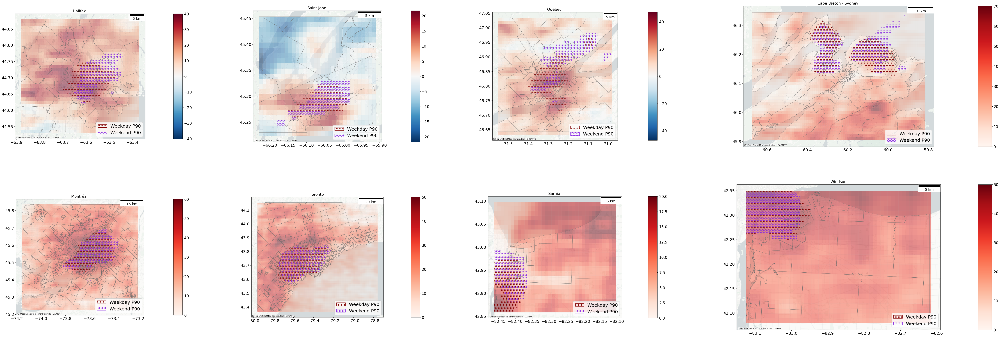

In [ ]:
fig = plt.figure(figsize=(16*3 + 24, 12*2))
gspec = gridspec.GridSpec(nrows=2, ncols=4, width_ratios=[1, 1, 1, 1.5], height_ratios=[1, 1])

plt.rc('hatch', color='k', linewidth=0.8)

plot_order = ["Halifax", "Saint John", "Québec", "Cape Breton - Sydney",
              "Montréal", "Toronto", "Sarnia", "Windsor"]

for c in range(len(plot_order)):

    city = plot_order[c]
    ax = plt.subplot(gspec[c])

    ax.tick_params(axis='both', which='major', labelsize=16)

    if city in ["Cape Breton - Sydney", "Halifax", "Saint John"]:

        wkday_xr = city_subset(city, fetch_plot_Xr(no2_wkday_binary_atl["weekday"], coord_atl_gdf))
        wkend_xr = city_subset(city, fetch_plot_Xr(no2_wkday_binary_atl["weekend"], coord_atl_gdf))
        wk_delta_xr, wkday_agg_xr, wkend_agg_xr = make_wkday_outputs(city, wkday_xr, wkend_xr, percentage_difference = True)
        wk_delta_xr, wkday_agg_xr, wkend_agg_xr = city_convert_gdf(city, wk_delta_xr), city_convert_gdf(city, wkday_agg_xr), city_convert_gdf(city, wkend_agg_xr)

        if np.nanmin(wk_delta_xr.observation.values) > -10:
            cmap = "Reds"
            vmax = round(max(wk_delta_xr.observation), -1)
            vmin = 0
        else:
            cmap = "RdBu_r"
            vmax = max(abs(min(wk_delta_xr.observation)), max(wk_delta_xr.observation))
            vmin = max(abs(min(wk_delta_xr.observation)), max(wk_delta_xr.observation)) * -1

        city_plot(city, wk_delta_xr, ax, aggregate_key = "",
                  vmax = vmax,
                  vmin = vmin,
                  title=True, cmap = cmap)

        if city == "Cape Breton - Sydney":
            intersect_das[city].plot(ax=ax, facecolor="none", edgecolor="dimgrey", linewidth=0.4)
        else:
            intersect_cts[city].plot(ax=ax, facecolor="none", edgecolor="dimgrey", linewidth=0.4)

        wkday_agg_xr[~pd.isnull(wkday_agg_xr["observation"])].plot(ax=ax, facecolor="none", edgecolor="maroon", linewidth=0, hatch="o", label = "Weekday P90", aspect=None)
        wkend_agg_xr[~pd.isnull(wkend_agg_xr["observation"])].plot(ax=ax, facecolor="none", edgecolor="blueviolet", linewidth=0, hatch="O", label = "Weekend P90", aspect=None)

        lines = [
            Patch(facecolor="none", edgecolor=t.get_edgecolor(), hatch=t.get_hatch())
            for t in ax.collections[-2:]
        ]
        labels = [t.get_label() for t in ax.collections[-2:]]
        ax.legend(lines, labels, loc="lower right", prop={'size': 18})

    elif city in ["Québec", "Montréal", "Toronto", "Sarnia", "Windsor"]:

        wkday_xr = city_subset(city, fetch_plot_Xr(no2_wkday_binary_qw["weekday"], coord_qw_gdf))
        wkend_xr = city_subset(city, fetch_plot_Xr(no2_wkday_binary_qw["weekend"], coord_qw_gdf))
        wk_delta_xr, wkday_agg_xr, wkend_agg_xr = make_wkday_outputs(city, wkday_xr, wkend_xr, percentage_difference = True)
        wk_delta_xr, wkday_agg_xr, wkend_agg_xr = city_convert_gdf(city, wk_delta_xr), city_convert_gdf(city, wkday_agg_xr), city_convert_gdf(city, wkend_agg_xr)

        if np.nanmin(wk_delta_xr.observation.values) > -10:
            cmap = "Reds"
            vmax = round(max(wk_delta_xr.observation), -1)
            vmin = 0
        else:
            cmap = "RdBu_r"
            vmax = max(abs(min(wk_delta_xr.observation)), max(wk_delta_xr.observation))
            vmin = max(abs(min(wk_delta_xr.observation)), max(wk_delta_xr.observation)) * -1

        city_plot(city, wk_delta_xr, ax, aggregate_key = "",
                  vmax = vmax,
                  vmin = vmin,
                  title=True, cmap = cmap)

        intersect_cts[city].plot(ax=ax, facecolor="none", edgecolor="dimgrey", linewidth=0.4)

        wkday_agg_xr[~pd.isnull(wkday_agg_xr["observation"])].plot(ax=ax, facecolor="none", edgecolor="maroon", linewidth=0, hatch="o", label = "Weekday P90", aspect=None)
        wkend_agg_xr[~pd.isnull(wkend_agg_xr["observation"])].plot(ax=ax, facecolor="none", edgecolor="blueviolet", linewidth=0, hatch="O", label = "Weekend P90", aspect=None)

        lines = [
            Patch(facecolor="none", edgecolor=t.get_edgecolor(), hatch=t.get_hatch())
            for t in ax.collections[-2:]
        ]
        labels = [t.get_label() for t in ax.collections[-2:]]
        ax.legend(lines, labels, loc="lower right", prop={'size': 18})

In [ ]:
tract_exposure = []

for city in  ["Halifax", "Saint John", "Cape Breton - Sydney", "Québec", "Montréal", "Toronto", "Sarnia", "Windsor"]:

    if city == "Cape Breton - Sydney":
        df = copy.deepcopy(within_das[city])
    else:
        df = copy.deepcopy(within_cts[city])

    tem = pd.melt(df, id_vars=["DGUID","geometry","PCNAME","within","Population"])
    tem["season"] = tem["variable"].apply(lambda x: x.replace("tempo_no2_","").split("_")[0])
    tem["days"] = tem["variable"].apply(lambda x: x.replace("tempo_no2_","").split("_")[1].title())
    tem = tem[(tem["Population"] > 0) & (~pd.isnull(tem['value']))].reset_index(drop=True)

    tract_exposure.append(tem)

tract_exposure = pd.concat(tract_exposure)
tract_exposure.columns = ["DGUID","geometry","Municipality","within","Population","var","tract_no2","Season","Days"]
tract_exposure['tract_no2'] = tract_exposure['tract_no2'] / 1e15

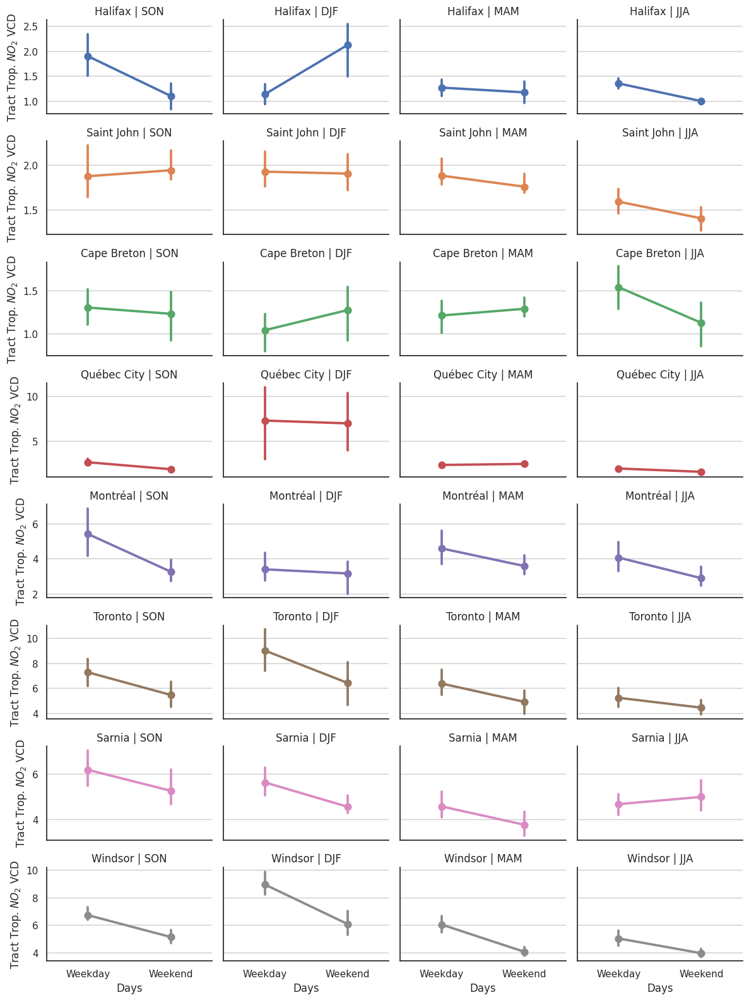

In [ ]:
tem = copy.deepcopy(tract_exposure)
tem['Municipality'] = tem['Municipality'].apply(lambda x: x.replace(" - Sydney", "") if x == "Cape Breton - Sydney" else x)
tem['Municipality'] = tem['Municipality'].apply(lambda x: x + " City" if x == "Québec" else x)
tem['Municipality'] = tem['Municipality'].astype("category").cat.set_categories(["Halifax", "Saint John", "Cape Breton", "Québec City", "Montréal", "Toronto", "Sarnia", "Windsor"])

seaborn.set_theme(font_scale=1)
seaborn.set_style("white")
g = seaborn.FacetGrid(data = tem, col="Season", row="Municipality", hue="Municipality", height=2, aspect=1.5, sharey="row")
g.map_dataframe(seaborn.pointplot, x="Days", y="tract_no2", errorbar=('pi', 50))
g.set(ylabel="Tract Trop. " + "$NO_{2}$" + " VCD")
g.set_titles(template="{row_name} | {col_name}")

for ax in g.axes.flat:
    ax.yaxis.grid(True)

#### **2) Diurnal Hourly NO<sub>2</sub> VCD stratified by Seasons and Weekday-Weekend groups:**

In [ ]:
def make_wkday_hour_mean(city, no2_dayhour_agg, coords_arr, census_unit_data, population_data):

    coords_gdf = gpd.GeoDataFrame({
        "longitude": coords_arr[:,:,0].flatten(),
        "latitude": coords_arr[:,:,1].flatten(),
    })

    ##  extract area-weighted mean TEMPO tropospheric NO2 VCD stratified by weekday-weekend split and hourly intervals

    for h in sorted(no2_dayhour_agg.keys()):
        for w in ["weekday", "weekend"]:

            if len(no2_dayhour_agg[h][w].shape) > 0:
                no2_dayhour_agg[h][w] = fetch_plot_Xr(no2_dayhour_agg[h][w], coords_gdf)
            else:
                no2_dayhour_agg[h][w] = np.empty((coords_arr.shape[0], coords_arr.shape[1]))
                no2_dayhour_agg[h][w][:] = np.nan
                no2_dayhour_agg[h][w] = fetch_plot_Xr(no2_dayhour_agg[h][w], coords_gdf)

            city_interp = city_subset(city, no2_dayhour_agg[h][w])

            city_zs = eet.exact_extract(city_interp, census_unit_data[city], 'mean')
            city_zs = [city_zs[n]['properties']['mean'] for n in range(census_unit_data[city].shape[0])]

            census_unit_data[city]["tempo_no2_" + "hour_" + h + "_" + w] = pd.Series(city_zs)

    ##  merge with census unit population in 2021

    census_unit_data[city] = census_unit_data[city].merge(population_data[["DGUID","Population"]], on="DGUID", how="left")

    out = pd.melt(census_unit_data[city], id_vars=["DGUID","geometry","PCNAME","included","Population"])
    out["hour"] = out["variable"].apply(lambda x: x.replace("tempo_no2_","").split("_")[1])
    out["days"] = out["variable"].apply(lambda x: x.replace("tempo_no2_","").split("_")[2])
    out = out[(out["Population"] > 0) & (~pd.isnull(out['value']))].reset_index(drop=True)

    ##  compute census population weighted NO2

    weighted = out.groupby(['PCNAME','hour','days']).agg(
        population_weighted_no2 = ("value", lambda x: np.average(x, weights = tem.loc[x.index, "Population"]))
    ).reset_index()

    return weighted

In [ ]:
def make_wkday_hour_pixel_counts(city, no2_dayhour_count_agg, coords_arr):

    coords_gdf = gpd.GeoDataFrame({
        "longitude": coords_arr[:,:,0].flatten(),
        "latitude": coords_arr[:,:,1].flatten(),
    })

    count_pixel_exposure = []

    ##  extract area-weighted mean TEMPO tropospheric NO2 VCD stratified by weekday-weekend split and hourly intervals

    for h in sorted(no2_dayhour_count_agg.keys()):
        for w in ["weekday", "weekend"]:

            if len(no2_dayhour_count_agg[h][w].shape) > 0:
                no2_dayhour_count_agg[h][w] = fetch_plot_Xr(no2_dayhour_count_agg[h][w], coords_gdf)
            else:
                no2_dayhour_count_agg[h][w] = np.empty((coords_arr.shape[0], coords_arr.shape[1]))
                no2_dayhour_count_agg[h][w][:] = np.nan
                no2_dayhour_count_agg[h][w] = fetch_plot_Xr(no2_dayhour_count_agg[h][w], coords_gdf)

            city_no_interp = city_subset(city, no2_dayhour_count_agg[h][w], interp=False)

            obs = city_no_interp.observation.values
            obs = np.nan_to_num(obs, nan=0)
            mean_obs_pix = np.mean(obs)
            mean_obs_pix_df = pd.DataFrame({
                "city": city,
                "wday": w,
                "hour": h,
                "mean_count_pixels": mean_obs_pix
            }, index=[0])

            count_pixel_exposure.append(mean_obs_pix_df)

    count_pixel_exposure = pd.concat(count_pixel_exposure)

    return count_pixel_exposure

In [ ]:
weighted_exposure = []

for city in  ["Halifax", "Saint John", "Cape Breton - Sydney", "Québec", "Montréal", "Toronto", "Sarnia", "Windsor"]:

    if city in ["Halifax", "Saint John"]:
        weighted = make_wkday_hour_mean(
            city, no2_dayhour_atl, coord_atl, within_cts, pop_cts
        )
    elif city in ["Québec", "Montréal", "Toronto", "Sarnia", "Windsor"]:
        weighted = make_wkday_hour_mean(
            city, no2_dayhour_qw, coord_qw, within_cts, pop_cts
        )
    else:
        weighted = make_wkday_hour_mean(
            city, no2_dayhour_atl, coord_atl, within_das, pop_das
        )

    weighted_exposure.append(weighted)

weighted_exposure = pd.concat(weighted_exposure)
weighted_exposure['population_weighted_no2'] = weighted_exposure['population_weighted_no2'] / 1e15

weighted_exposure['PCNAME'] = weighted_exposure['PCNAME'].astype("category").cat.set_categories(
    ["Halifax", "Saint John", "Cape Breton - Sydney", "Québec", "Montréal", "Toronto", "Sarnia", "Windsor"]
)
weighted_exposure["hour"] = weighted_exposure["hour"].astype("category").cat.set_categories(
    sorted(set(weighted_exposure["hour"]))
)

In [ ]:
seasons = ["SON","DJF","MAM","JJA"]

seasonal_weighted_exposure = {}

for s in seasons:

    s_weighted_exposure = []

    for city in  ["Halifax", "Saint John", "Cape Breton - Sydney", "Québec", "Montréal", "Toronto", "Sarnia", "Windsor"]:

        if city in ["Halifax", "Saint John"]:
            weighted = make_wkday_hour_mean(
                city, no2_seasonal_dayhour_atl[s], coord_atl, within_cts, pop_cts
            )
        elif city in ["Québec", "Montréal", "Toronto", "Sarnia", "Windsor"]:
            weighted = make_wkday_hour_mean(
                city, no2_seasonal_dayhour_qw[s], coord_qw, within_cts, pop_cts
            )
        else:
            weighted = make_wkday_hour_mean(
                city, no2_seasonal_dayhour_atl[s], coord_atl, within_das, pop_das
            )

        s_weighted_exposure.append(weighted)

    s_weighted_exposure = pd.concat(s_weighted_exposure)
    s_weighted_exposure['population_weighted_no2'] = s_weighted_exposure['population_weighted_no2'] / 1e15
    s_weighted_exposure['PCNAME'] = s_weighted_exposure['PCNAME'].astype("category").cat.set_categories(
        ["Halifax", "Saint John", "Cape Breton - Sydney", "Québec", "Montréal", "Toronto", "Sarnia", "Windsor"]
    )
    s_weighted_exposure["hour"] = s_weighted_exposure["hour"].astype("category").cat.set_categories(
        sorted(set(s_weighted_exposure["hour"]))
    )

    seasonal_weighted_exposure[s] = s_weighted_exposure

In [ ]:
seasons = ["SON","DJF","MAM","JJA"]

order = ["Halifax", "Saint John", "Québec", "Cape Breton - Sydney",
         "Montréal", "Toronto", "Sarnia", "Windsor"]

seasonal_count_pixel_exposure = []

for s in seasons:

    for city in  ["Halifax", "Saint John", "Cape Breton - Sydney", "Québec", "Montréal", "Toronto", "Sarnia", "Windsor"]:

        if city in ["Halifax", "Saint John", "Cape Breton - Sydney"]:
            weighted = make_wkday_hour_pixel_counts(
                city, no2_seasonal_dayhour_count_atl[s], coord_atl, 
            )
        elif city in ["Québec", "Montréal", "Toronto", "Sarnia", "Windsor"]:
            weighted = make_wkday_hour_pixel_counts(
                city, no2_seasonal_dayhour_count_qw[s], coord_qw, 
            )

    for c in range(len(order)):

        city = order[c]

        city_xr = xr.Dataset.from_dataframe(pc_grids_coords[city].set_index(['lon','lat'])).drop_vars('geometry')
        city_xr = city_xr.rio.write_crs("epsg:4326")
        city_xr = city_xr.rename({"lon": "x", "lat": "y"})
        city_xr = city_xr.transpose("y", "x")
        city_xr = city_xr.reindex(y=list(reversed(city_xr.y)))

        if city in ["Halifax", "Cape Breton - Sydney", "Saint John"]:

            for h in sorted(no2_seasonal_dayhour_count_atl[s].keys()):

                for w in ["weekday", "weekend"]:

                    city_no_interp = city_subset(city, no2_seasonal_dayhour_count_atl[s][h][w], interp=False)

                    obs = city_no_interp.observation.values
                    obs = np.nan_to_num(obs, nan=0)
                    mean_obs_pix = np.mean(obs)
                    mean_obs_pix_df = pd.DataFrame({
                        "season": s,
                        "city": city,
                        "wday": w,
                        "hour": h,
                        "mean_count_pixels": mean_obs_pix
                    }, index=[0])

                    seasonal_count_pixel_exposure.append(mean_obs_pix_df)

        elif city in ["Québec", "Montréal", "Toronto", "Sarnia", "Windsor"]:

            for h in sorted(no2_seasonal_dayhour_count_qw[s].keys()):

                for w in ["weekday", "weekend"]:

                    city_no_interp = city_subset(city, no2_seasonal_dayhour_count_qw[s][h][w], interp=False)

                    obs = city_no_interp.observation.values
                    obs = np.nan_to_num(obs, nan=0)
                    mean_obs_pix = np.mean(obs)
                    mean_obs_pix_df = pd.DataFrame({
                        "season": s,
                        "city": city,
                        "wday": w,
                        "hour": str(int(h) - 1).zfill(2),                      ##  AT --> ET = -1 hour
                        "mean_count_pixels": mean_obs_pix
                    }, index=[0])

                    seasonal_count_pixel_exposure.append(mean_obs_pix_df)

seasonal_count_pixel_exposure = pd.concat(seasonal_count_pixel_exposure)

In [ ]:
## get hourly interval summary (with adjustments) based on TEMPO scanning time

atl_time = pd.read_excel(f"/content/drive/MyDrive/TEMPO/scripts for Visualization/Atl_timestamps.xlsx")
qw_time = pd.read_excel(f"/content/drive/MyDrive/TEMPO/scripts for Visualization/QW_timestamps.xlsx")

atl_time = atl_time.drop(["weekday_hour","week_hour"], axis=1)
qw_time = qw_time.drop(["weekday_hour","week_hour"], axis=1)

atl_time['hour'] = atl_time['hour'].apply(lambda x: str(x).zfill(2))
qw_time['hour'] = qw_time['hour'].apply(lambda x: str(x - 1).zfill(2))                      ##  AT --> ET = -1 hour

for c in ["Halifax", "Saint John", "Cape Breton - Sydney"]:
    atl_time[c] = 1
for c in ["Québec", "Montréal", "Toronto", "Sarnia", "Windsor"]:
    qw_time[c] = 1

atl_time = pd.melt(atl_time, id_vars=["timestamp", "month",	"season", "week_of_year", "day_of_week", "hour", "weekday_weekend"])
atl_time.columns = ["timestamp", "month",	"season", "week_of_year", "day_of_week", "hour", "wday", "city", "value"]
qw_time = pd.melt(qw_time, id_vars=["timestamp", "month",	"season", "week_of_year", "day_of_week", "hour", "weekday_weekend"])
qw_time.columns = ["timestamp", "month",	"season", "week_of_year", "day_of_week", "hour", "wday", "city", "value"]

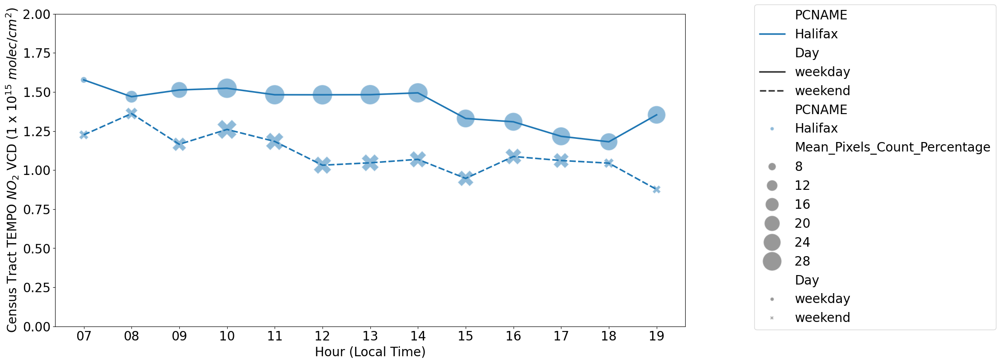

In [ ]:
plt.rcParams["figure.figsize"] = [18,9]

plot_df = weighted_exposure[weighted_exposure["PCNAME"].isin(["Halifax"])]

plot_df['PCNAME'] = plot_df['PCNAME'].astype("category").cat.set_categories(["Halifax"])

plot_df = plot_df.merge(seasonal_count_pixel_exposure.groupby(['city','wday','hour']).agg({'mean_count_pixels': np.sum}).reset_index(),
                        how = "left", left_on = ["PCNAME","days","hour"], right_on = ["city","wday","hour"])

plot_df = plot_df.merge(atl_time.groupby(['city','wday','hour']).agg({'value': np.sum}).reset_index(),
                        how = "left", on = ["city","wday","hour"])

plot_df['mean_count_pixels_percent'] = plot_df['mean_count_pixels'] / plot_df['value'] * 100

plot_df['PCNAME'] = plot_df['PCNAME'].apply(lambda x: x.replace(" - Sydney", "") if x == "Cape Breton - Sydney" else x)

plot_df.columns = ["PCNAME","Hour","Day","population_weighted_no2","city","wday","mean_count_pixels","value","Mean_Pixels_Count_Percentage"]

seaborn.lineplot(
    data = plot_df,
    x = "Hour", y = "population_weighted_no2", hue="PCNAME", style="Day",
    marker = "none", linewidth=2.5,
    palette = np.array(seaborn.color_palette())[0:],
)
seaborn.scatterplot(
    data = plot_df,
    x = "Hour", y = "population_weighted_no2", hue="PCNAME", style="Day", size = "Mean_Pixels_Count_Percentage",
    sizes=(100, 1000), alpha=0.5,
    palette = np.array(seaborn.color_palette())[0:],
    # legend = False
)

plt.ylabel("Census Tract TEMPO " + "$NO_{2}$" + " VCD (1 x " + "$10^{15}$ " + "$  molec/cm^{2})$", size=20)
plt.xlabel("Hour (Local Time)", size=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.ylim(bottom=0, top=2)
plt.legend(title="", prop={'size': 20}, bbox_to_anchor=(1.1, 1.05))

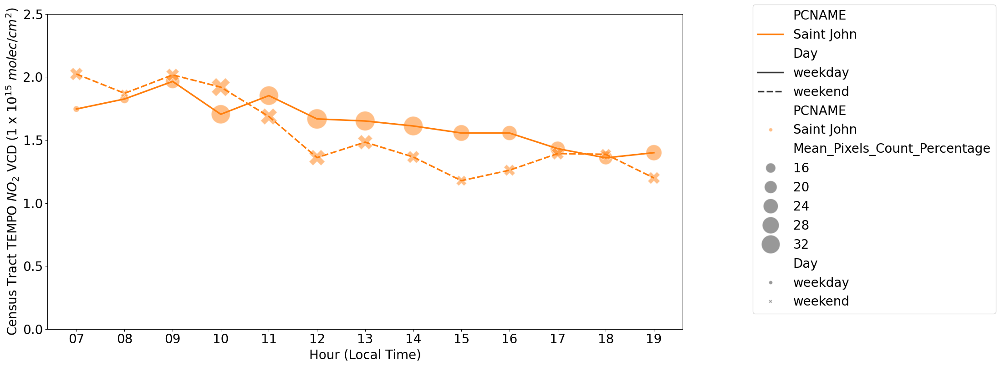

In [ ]:
plt.rcParams["figure.figsize"] = [18,9]

plot_df = weighted_exposure[weighted_exposure["PCNAME"].isin(["Saint John"])]

plot_df['PCNAME'] = plot_df['PCNAME'].astype("category").cat.set_categories(["Saint John"])

plot_df = plot_df.merge(seasonal_count_pixel_exposure.groupby(['city','wday','hour']).agg({'mean_count_pixels': np.sum}).reset_index(),
                        how = "left", left_on = ["PCNAME","days","hour"], right_on = ["city","wday","hour"])

plot_df = plot_df.merge(atl_time.groupby(['city','wday','hour']).agg({'value': np.sum}).reset_index(),
                        how = "left", on = ["city","wday","hour"])

plot_df['mean_count_pixels_percent'] = plot_df['mean_count_pixels'] / plot_df['value'] * 100

plot_df['PCNAME'] = plot_df['PCNAME'].apply(lambda x: x.replace(" - Sydney", "") if x == "Cape Breton - Sydney" else x)

plot_df.columns = ["PCNAME","Hour","Day","population_weighted_no2","city","wday","mean_count_pixels","value","Mean_Pixels_Count_Percentage"]

seaborn.lineplot(
    data = plot_df,
    x = "Hour", y = "population_weighted_no2", hue="PCNAME", style="Day",
    marker = "none", linewidth=2.5,
    palette = np.array(seaborn.color_palette())[1:],
)
seaborn.scatterplot(
    data = plot_df,
    x = "Hour", y = "population_weighted_no2", hue="PCNAME", style="Day", size = "Mean_Pixels_Count_Percentage",
    sizes=(100, 1000), alpha=0.5,
    palette = np.array(seaborn.color_palette())[1:],
    # legend = False
)

plt.ylabel("Census Tract TEMPO " + "$NO_{2}$" + " VCD (1 x " + "$10^{15}$ " + "$  molec/cm^{2})$", size=20)
plt.xlabel("Hour (Local Time)", size=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.ylim(bottom=0, top=2.5)
plt.legend(title="", prop={'size': 20}, bbox_to_anchor=(1.1, 1.05))

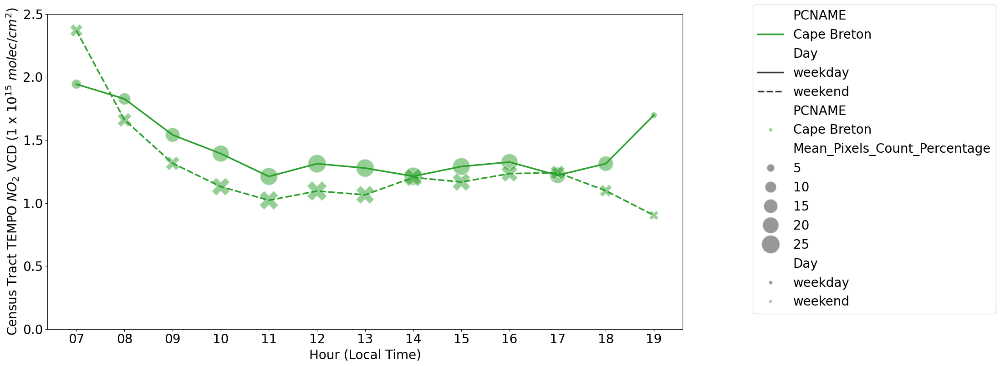

In [ ]:
plt.rcParams["figure.figsize"] = [18,9]

plot_df = weighted_exposure[weighted_exposure["PCNAME"].isin(["Cape Breton - Sydney"])]

plot_df['PCNAME'] = plot_df['PCNAME'].astype("category").cat.set_categories(["Cape Breton - Sydney"])

plot_df = plot_df.merge(seasonal_count_pixel_exposure.groupby(['city','wday','hour']).agg({'mean_count_pixels': np.sum}).reset_index(),
                        how = "left", left_on = ["PCNAME","days","hour"], right_on = ["city","wday","hour"])

plot_df = plot_df.merge(atl_time.groupby(['city','wday','hour']).agg({'value': np.sum}).reset_index(),
                        how = "left", on = ["city","wday","hour"])

plot_df['mean_count_pixels_percent'] = plot_df['mean_count_pixels'] / plot_df['value'] * 100

plot_df['PCNAME'] = plot_df['PCNAME'].apply(lambda x: x.replace(" - Sydney", "") if x == "Cape Breton - Sydney" else x)

plot_df.columns = ["PCNAME","Hour","Day","population_weighted_no2","city","wday","mean_count_pixels","value","Mean_Pixels_Count_Percentage"]

seaborn.lineplot(
    data = plot_df,
    x = "Hour", y = "population_weighted_no2", hue="PCNAME", style="Day",
    marker = "none", linewidth=2.5,
    palette = np.array(seaborn.color_palette())[2:],
)
seaborn.scatterplot(
    data = plot_df,
    x = "Hour", y = "population_weighted_no2", hue="PCNAME", style="Day", size = "Mean_Pixels_Count_Percentage",
    sizes=(100, 1000), alpha=0.5,
    palette = np.array(seaborn.color_palette())[2:],
    # legend = False
)

plt.ylabel("Census Tract TEMPO " + "$NO_{2}$" + " VCD (1 x " + "$10^{15}$ " + "$  molec/cm^{2})$", size=20)
plt.xlabel("Hour (Local Time)", size=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.ylim(bottom=0, top=2.5)
plt.legend(title="", prop={'size': 20}, bbox_to_anchor=(1.1, 1.05))

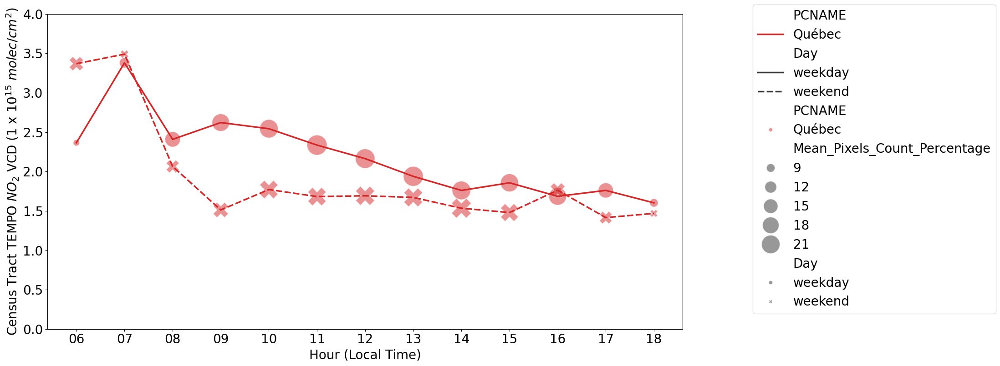

In [ ]:
plt.rcParams["figure.figsize"] = [18,9]

plot_df = weighted_exposure[weighted_exposure["PCNAME"].isin(["Québec"])]

plot_df['PCNAME'] = plot_df['PCNAME'].astype("category").cat.set_categories(["Québec"])

plot_df = plot_df.merge(seasonal_count_pixel_exposure.groupby(['city','wday','hour']).agg({'mean_count_pixels': np.sum}).reset_index(),
                        how = "left", left_on = ["PCNAME","days","hour"], right_on = ["city","wday","hour"])

plot_df = plot_df.merge(qw_time.groupby(['city','wday','hour']).agg({'value': np.sum}).reset_index(),
                        how = "left", on = ["city","wday","hour"])

plot_df['mean_count_pixels_percent'] = plot_df['mean_count_pixels'] / plot_df['value'] * 100

plot_df['PCNAME'] = plot_df['PCNAME'].apply(lambda x: x.replace(" - Sydney", "") if x == "Cape Breton - Sydney" else x)

plot_df.columns = ["PCNAME","Hour","Day","population_weighted_no2","city","wday","mean_count_pixels","value","Mean_Pixels_Count_Percentage"]

seaborn.lineplot(
    data = plot_df,
    x = "Hour", y = "population_weighted_no2", hue="PCNAME", style="Day",
    marker = "none", linewidth=2.5,
    palette = np.array(seaborn.color_palette())[3:],
)
seaborn.scatterplot(
    data = plot_df,
    x = "Hour", y = "population_weighted_no2", hue="PCNAME", style="Day", size = "Mean_Pixels_Count_Percentage",
    sizes=(100, 1000), alpha=0.5,
    palette = np.array(seaborn.color_palette())[3:],
    # legend = False
)

plt.ylabel("Census Tract TEMPO " + "$NO_{2}$" + " VCD (1 x " + "$10^{15}$ " + "$  molec/cm^{2})$", size=20)
plt.xlabel("Hour (Local Time)", size=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.ylim(bottom=0, top=4)
plt.legend(title="", prop={'size': 20}, bbox_to_anchor=(1.1, 1.05))

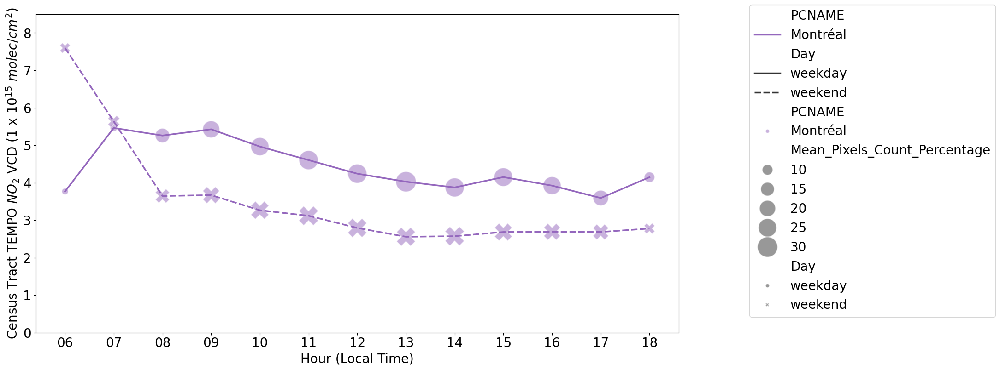

In [ ]:
plt.rcParams["figure.figsize"] = [18,9]

plot_df = weighted_exposure[weighted_exposure["PCNAME"].isin(["Montréal"])]

plot_df['PCNAME'] = plot_df['PCNAME'].astype("category").cat.set_categories(["Montréal"])

plot_df = plot_df.merge(seasonal_count_pixel_exposure.groupby(['city','wday','hour']).agg({'mean_count_pixels': np.sum}).reset_index(),
                        how = "left", left_on = ["PCNAME","days","hour"], right_on = ["city","wday","hour"])

plot_df = plot_df.merge(qw_time.groupby(['city','wday','hour']).agg({'value': np.sum}).reset_index(),
                        how = "left", on = ["city","wday","hour"])

plot_df['mean_count_pixels_percent'] = plot_df['mean_count_pixels'] / plot_df['value'] * 100

plot_df['PCNAME'] = plot_df['PCNAME'].apply(lambda x: x.replace(" - Sydney", "") if x == "Cape Breton - Sydney" else x)

plot_df.columns = ["PCNAME","Hour","Day","population_weighted_no2","city","wday","mean_count_pixels","value","Mean_Pixels_Count_Percentage"]

seaborn.lineplot(
    data = plot_df,
    x = "Hour", y = "population_weighted_no2", hue="PCNAME", style="Day",
    marker = "none", linewidth=2.5,
    palette = np.array(seaborn.color_palette())[4:],
)
seaborn.scatterplot(
    data = plot_df,
    x = "Hour", y = "population_weighted_no2", hue="PCNAME", style="Day", size = "Mean_Pixels_Count_Percentage",
    sizes=(100, 1000), alpha=0.5,
    palette = np.array(seaborn.color_palette())[4:],
    # legend = False
)

plt.ylabel("Census Tract TEMPO " + "$NO_{2}$" + " VCD (1 x " + "$10^{15}$ " + "$  molec/cm^{2})$", size=20)
plt.xlabel("Hour (Local Time)", size=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.ylim(bottom=0, top=8.5)
plt.legend(title="", prop={'size': 20}, bbox_to_anchor=(1.1, 1.05))

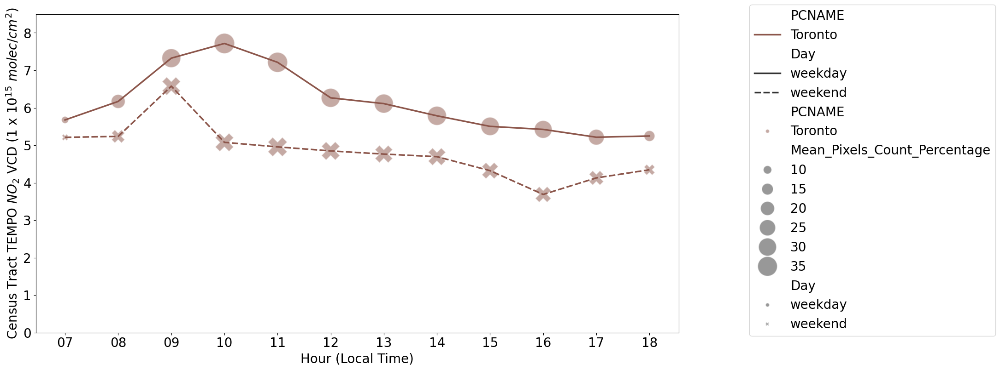

In [ ]:
plt.rcParams["figure.figsize"] = [18,9]

plot_df = weighted_exposure[weighted_exposure["PCNAME"].isin(["Toronto"])]

plot_df['PCNAME'] = plot_df['PCNAME'].astype("category").cat.set_categories(["Toronto"])

plot_df = plot_df.merge(seasonal_count_pixel_exposure.groupby(['city','wday','hour']).agg({'mean_count_pixels': np.sum}).reset_index(),
                        how = "left", left_on = ["PCNAME","days","hour"], right_on = ["city","wday","hour"])

plot_df = plot_df.merge(qw_time.groupby(['city','wday','hour']).agg({'value': np.sum}).reset_index(),
                        how = "left", on = ["city","wday","hour"])

plot_df['mean_count_pixels_percent'] = plot_df['mean_count_pixels'] / plot_df['value'] * 100

plot_df['PCNAME'] = plot_df['PCNAME'].apply(lambda x: x.replace(" - Sydney", "") if x == "Cape Breton - Sydney" else x)

plot_df.columns = ["PCNAME","Hour","Day","population_weighted_no2","city","wday","mean_count_pixels","value","Mean_Pixels_Count_Percentage"]

seaborn.lineplot(
    data = plot_df,
    x = "Hour", y = "population_weighted_no2", hue="PCNAME", style="Day",
    marker = "none", linewidth=2.5,
    palette = np.array(seaborn.color_palette())[5:],
)
seaborn.scatterplot(
    data = plot_df,
    x = "Hour", y = "population_weighted_no2", hue="PCNAME", style="Day", size = "Mean_Pixels_Count_Percentage",
    sizes=(100, 1000), alpha=0.5,
    palette = np.array(seaborn.color_palette())[5:],
    # legend = False
)

plt.ylabel("Census Tract TEMPO " + "$NO_{2}$" + " VCD (1 x " + "$10^{15}$ " + "$  molec/cm^{2})$", size=20)
plt.xlabel("Hour (Local Time)", size=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.ylim(bottom=0, top=8.5)
plt.legend(title="", prop={'size': 20}, bbox_to_anchor=(1.1, 1.05))

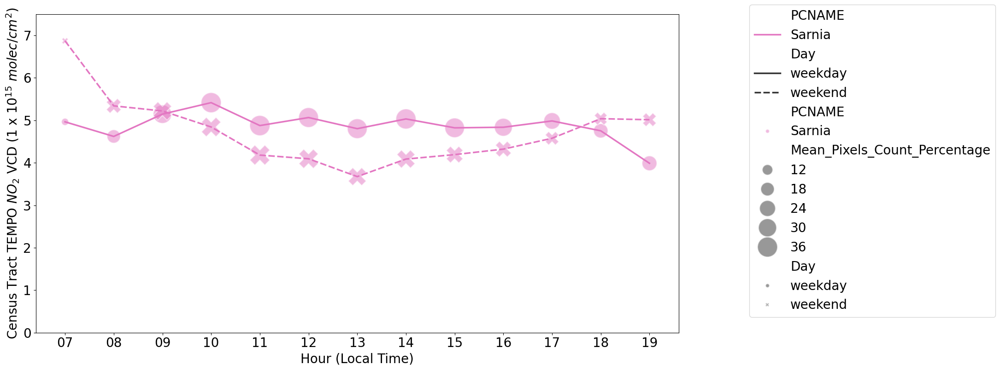

In [ ]:
plt.rcParams["figure.figsize"] = [18,9]

plot_df = weighted_exposure[weighted_exposure["PCNAME"].isin(["Sarnia"])]

plot_df['PCNAME'] = plot_df['PCNAME'].astype("category").cat.set_categories(["Sarnia"])

plot_df = plot_df.merge(seasonal_count_pixel_exposure.groupby(['city','wday','hour']).agg({'mean_count_pixels': np.sum}).reset_index(),
                        how = "left", left_on = ["PCNAME","days","hour"], right_on = ["city","wday","hour"])

plot_df = plot_df.merge(qw_time.groupby(['city','wday','hour']).agg({'value': np.sum}).reset_index(),
                        how = "left", on = ["city","wday","hour"])

plot_df['mean_count_pixels_percent'] = plot_df['mean_count_pixels'] / plot_df['value'] * 100

plot_df['PCNAME'] = plot_df['PCNAME'].apply(lambda x: x.replace(" - Sydney", "") if x == "Cape Breton - Sydney" else x)

plot_df.columns = ["PCNAME","Hour","Day","population_weighted_no2","city","wday","mean_count_pixels","value","Mean_Pixels_Count_Percentage"]

seaborn.lineplot(
    data = plot_df,
    x = "Hour", y = "population_weighted_no2", hue="PCNAME", style="Day",
    marker = "none", linewidth=2.5,
    palette = np.array(seaborn.color_palette())[6:],
)
seaborn.scatterplot(
    data = plot_df,
    x = "Hour", y = "population_weighted_no2", hue="PCNAME", style="Day", size = "Mean_Pixels_Count_Percentage",
    sizes=(100, 1000), alpha=0.5,
    palette = np.array(seaborn.color_palette())[6:],
    # legend = False
)

plt.ylabel("Census Tract TEMPO " + "$NO_{2}$" + " VCD (1 x " + "$10^{15}$ " + "$  molec/cm^{2})$", size=20)
plt.xlabel("Hour (Local Time)", size=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.ylim(bottom=0, top=7.5)
plt.legend(title="", prop={'size': 20}, bbox_to_anchor=(1.1, 1.05))

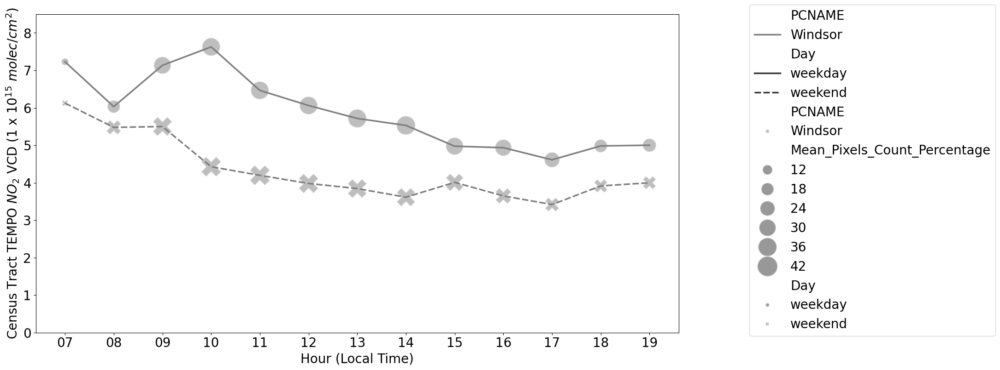

In [ ]:
plt.rcParams["figure.figsize"] = [18,9]

plot_df = weighted_exposure[weighted_exposure["PCNAME"].isin(["Windsor"])]

plot_df['PCNAME'] = plot_df['PCNAME'].astype("category").cat.set_categories(["Windsor"])

plot_df = plot_df.merge(seasonal_count_pixel_exposure.groupby(['city','wday','hour']).agg({'mean_count_pixels': np.sum}).reset_index(),
                        how = "left", left_on = ["PCNAME","days","hour"], right_on = ["city","wday","hour"])

plot_df = plot_df.merge(qw_time.groupby(['city','wday','hour']).agg({'value': np.sum}).reset_index(),
                        how = "left", on = ["city","wday","hour"])

plot_df['mean_count_pixels_percent'] = plot_df['mean_count_pixels'] / plot_df['value'] * 100

plot_df['PCNAME'] = plot_df['PCNAME'].apply(lambda x: x.replace(" - Sydney", "") if x == "Cape Breton - Sydney" else x)

plot_df.columns = ["PCNAME","Hour","Day","population_weighted_no2","city","wday","mean_count_pixels","value","Mean_Pixels_Count_Percentage"]

seaborn.lineplot(
    data = plot_df,
    x = "Hour", y = "population_weighted_no2", hue="PCNAME", style="Day",
    marker = "none", linewidth=2.5,
    palette = np.array(seaborn.color_palette())[7:],
)
seaborn.scatterplot(
    data = plot_df,
    x = "Hour", y = "population_weighted_no2", hue="PCNAME", style="Day", size = "Mean_Pixels_Count_Percentage",
    sizes=(100, 1000), alpha=0.5,
    palette = np.array(seaborn.color_palette())[7:],
    # legend = False
)

plt.ylabel("Census Tract TEMPO " + "$NO_{2}$" + " VCD (1 x " + "$10^{15}$ " + "$  molec/cm^{2})$", size=20)
plt.xlabel("Hour (Local Time)", size=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.ylim(bottom=0, top=8.5)
plt.legend(title="", prop={'size': 20}, bbox_to_anchor=(1.1, 1.05))

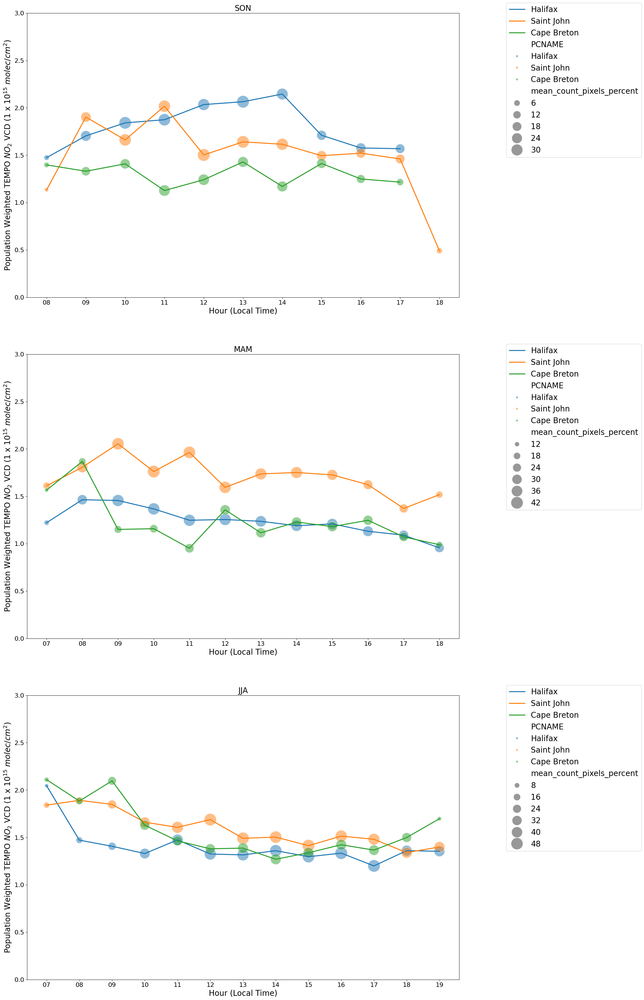

In [ ]:
fig, ax = plt.subplots(nrows=3, ncols=1, figsize=(20, 45))

seasons = ["SON","MAM","JJA"]

max_val = np.max([
    np.nanmax(seasonal_weighted_exposure[s][(seasonal_weighted_exposure[s]["days"] == "weekday") &
                                            (seasonal_weighted_exposure[s]["PCNAME"].isin(["Halifax", "Saint John", "Cape Breton - Sydney"]))]["population_weighted_no2"])
    for s in seasons]
)

c_count = 0

for s in seasons:

    plot_df = seasonal_weighted_exposure[s][(seasonal_weighted_exposure[s]["days"] == "weekday") &
                                            (seasonal_weighted_exposure[s]["PCNAME"].isin(["Halifax", "Saint John", "Cape Breton - Sydney"]))]

    plot_df['PCNAME'] = plot_df['PCNAME'].astype("category").cat.set_categories(["Halifax", "Saint John", "Cape Breton - Sydney"])
    plot_df['season'] = s

    plot_df = plot_df.merge(seasonal_count_pixel_exposure,
                            how = "left", left_on = ["PCNAME","season","days","hour"], right_on = ["city","season","wday","hour"])

    plot_df = plot_df.merge(atl_time.groupby(['season','city','wday','hour']).agg({'value': np.sum}).reset_index(),
                            how = "left", on = ['season',"city","wday","hour"])

    plot_df['mean_count_pixels_percent'] = plot_df['mean_count_pixels'] / plot_df['value'] * 100

    plot_df['PCNAME'] = plot_df['PCNAME'].apply(lambda x: x.replace(" - Sydney", "") if x == "Cape Breton - Sydney" else x)

    seaborn.lineplot(
        data = plot_df,
        x = "hour", y = "population_weighted_no2", hue="PCNAME",
        marker = "none", linewidth=2.5,
        ax = ax[c_count]
    )
    seaborn.scatterplot(
        data = plot_df,
        x = "hour", y = "population_weighted_no2", hue="PCNAME", size = "mean_count_pixels_percent", sizes=(100, 1000), alpha=0.5,
        # legend = False,
        ax = ax[c_count]
    )

    ax[c_count].set_ylim(0, round(max_val, 0) + 1)
    ax[c_count].set_ylabel("Population Weighted TEMPO " + "$NO_{2}$" + " VCD (1 x " + "$10^{15}$ " + "$  molec/cm^{2})$", size=20)
    ax[c_count].set_xlabel("Hour (Local Time)", size=20)
    ax[c_count].set_title(s, size=20)
    ax[c_count].tick_params(axis='both', which='major', labelsize=16)
    ax[c_count].legend(title="", prop={'size': 20}, bbox_to_anchor=(1.1, 1.05))


    c_count += 1

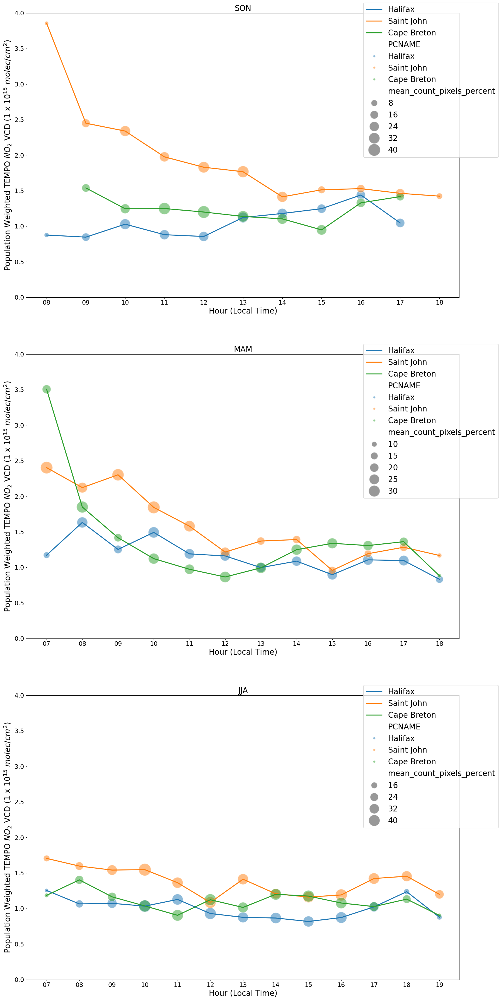

In [ ]:
fig, ax = plt.subplots(nrows=3, ncols=1, figsize=(20, 45))

seasons = ["SON","MAM","JJA"]

max_val = np.max([
    np.nanmax(seasonal_weighted_exposure[s][(seasonal_weighted_exposure[s]["days"] == "weekend") &
                                            (seasonal_weighted_exposure[s]["PCNAME"].isin(["Halifax", "Saint John", "Cape Breton - Sydney"]))]["population_weighted_no2"])
    for s in seasons]
)

c_count = 0

for s in seasons:

    plot_df = seasonal_weighted_exposure[s][(seasonal_weighted_exposure[s]["days"] == "weekend") &
                                            (seasonal_weighted_exposure[s]["PCNAME"].isin(["Halifax", "Saint John", "Cape Breton - Sydney"]))]

    plot_df['PCNAME'] = plot_df['PCNAME'].astype("category").cat.set_categories(["Halifax", "Saint John", "Cape Breton - Sydney"])
    plot_df['season'] = s

    plot_df = plot_df.merge(seasonal_count_pixel_exposure,
                            how = "left", left_on = ["PCNAME","season","days","hour"], right_on = ["city","season","wday","hour"])

    plot_df = plot_df.merge(atl_time.groupby(['season','city','wday','hour']).agg({'value': np.sum}).reset_index(),
                            how = "left", on = ['season',"city","wday","hour"])

    plot_df['mean_count_pixels_percent'] = plot_df['mean_count_pixels'] / plot_df['value'] * 100

    plot_df['PCNAME'] = plot_df['PCNAME'].apply(lambda x: x.replace(" - Sydney", "") if x == "Cape Breton - Sydney" else x)

    seaborn.lineplot(
        data = plot_df,
        x = "hour", y = "population_weighted_no2", hue="PCNAME",
        marker = "none", linewidth=2.5,
        ax = ax[c_count]
    )
    seaborn.scatterplot(
        data = plot_df,
        x = "hour", y = "population_weighted_no2", hue="PCNAME", size = "mean_count_pixels_percent", sizes=(100, 1000), alpha=0.5,
        # legend = False,
        ax = ax[c_count]
    )

    ax[c_count].set_ylim(0, round(max_val, 0))
    ax[c_count].set_ylabel("Population Weighted TEMPO " + "$NO_{2}$" + " VCD (1 x " + "$10^{15}$ " + "$  molec/cm^{2})$", size=20)
    ax[c_count].set_xlabel("Hour (Local Time)", size=20)
    ax[c_count].set_title(s, size=20)
    ax[c_count].tick_params(axis='both', which='major', labelsize=16)
    ax[c_count].legend(title="", prop={'size': 20}, bbox_to_anchor=(1.1, 1.05))


    c_count += 1

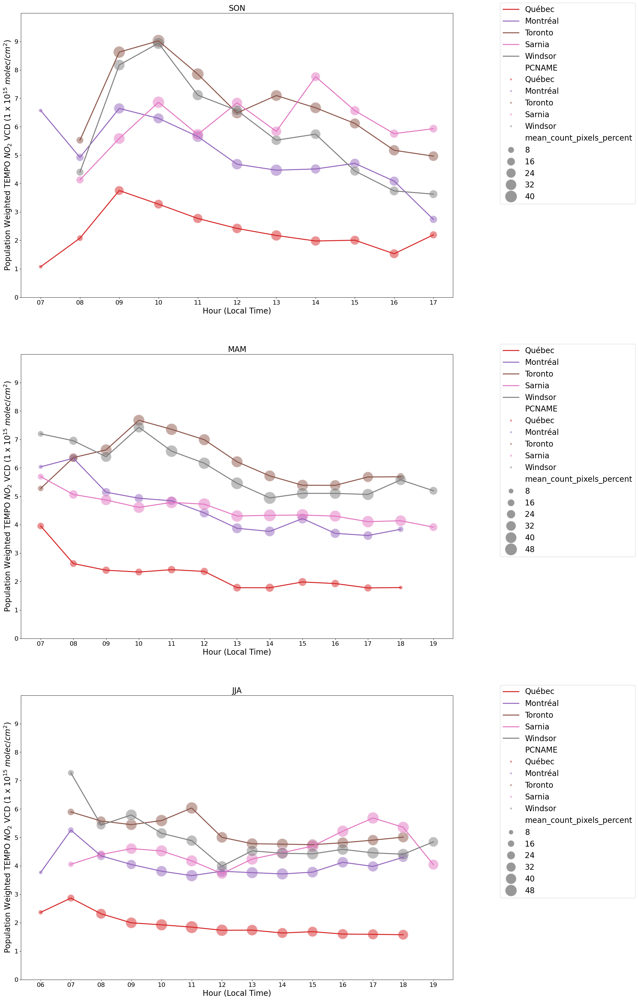

In [ ]:
fig, ax = plt.subplots(nrows=3, ncols=1, figsize=(20, 45))

seasons = ["SON","MAM","JJA"]

max_val = np.max([
    np.nanmax(seasonal_weighted_exposure[s][(seasonal_weighted_exposure[s]["days"] == "weekday") &
                                            (seasonal_weighted_exposure[s]["PCNAME"].isin(["Québec", "Montréal", "Toronto", "Sarnia", "Windsor"]))]["population_weighted_no2"])
    for s in seasons]
)

cmap = colors.ListedColormap(plt.cm.tab10.colors[3:])

c_count = 0

for s in seasons:

    plot_df = seasonal_weighted_exposure[s][(seasonal_weighted_exposure[s]["days"] == "weekday") &
                                            (seasonal_weighted_exposure[s]["PCNAME"].isin(["Québec", "Montréal", "Toronto", "Sarnia", "Windsor"]))]

    plot_df['PCNAME'] = plot_df['PCNAME'].astype("category").cat.set_categories(["Québec", "Montréal", "Toronto", "Sarnia", "Windsor"])
    plot_df['season'] = s

    plot_df = plot_df.merge(seasonal_count_pixel_exposure,
                            how = "left", left_on = ["PCNAME","season","days","hour"], right_on = ["city","season","wday","hour"])

    plot_df = plot_df.merge(qw_time.groupby(['season','city','wday','hour']).agg({'value': np.sum}).reset_index(),
                            how = "left", on = ['season',"city","wday","hour"])

    plot_df['mean_count_pixels_percent'] = plot_df['mean_count_pixels'] / plot_df['value'] * 100

    plot_df['hour'] = plot_df['hour'].astype("category").cat.set_categories(sorted(list(set(plot_df['hour']))))

    seaborn.lineplot(
        data = plot_df,
        x = "hour", y = "population_weighted_no2", hue="PCNAME",
        marker = "none", linewidth=2.5,
        palette = np.array(seaborn.color_palette())[3:],
        ax = ax[c_count]
    )
    seaborn.scatterplot(
        data = plot_df,
        x = "hour", y = "population_weighted_no2", hue="PCNAME", size = "mean_count_pixels_percent", sizes=(100, 1000), alpha=0.5,
        # legend = False,
        palette = np.array(seaborn.color_palette())[3:],
        ax = ax[c_count]
    )

    ax[c_count].set_ylim(0, round(max_val, 0)+1)
    ax[c_count].set_ylabel("Population Weighted TEMPO " + "$NO_{2}$" + " VCD (1 x " + "$10^{15}$ " + "$  molec/cm^{2})$", size=20)
    ax[c_count].set_xlabel("Hour (Local Time)", size=20)
    ax[c_count].set_title(s, size=20)
    ax[c_count].tick_params(axis='both', which='major', labelsize=16)
    ax[c_count].legend(title="", prop={'size': 20}, bbox_to_anchor=(1.1, 1.05))
    ax[c_count].set_yticks(np.arange(0, round(max_val, 0)+1, 1))

    c_count += 1

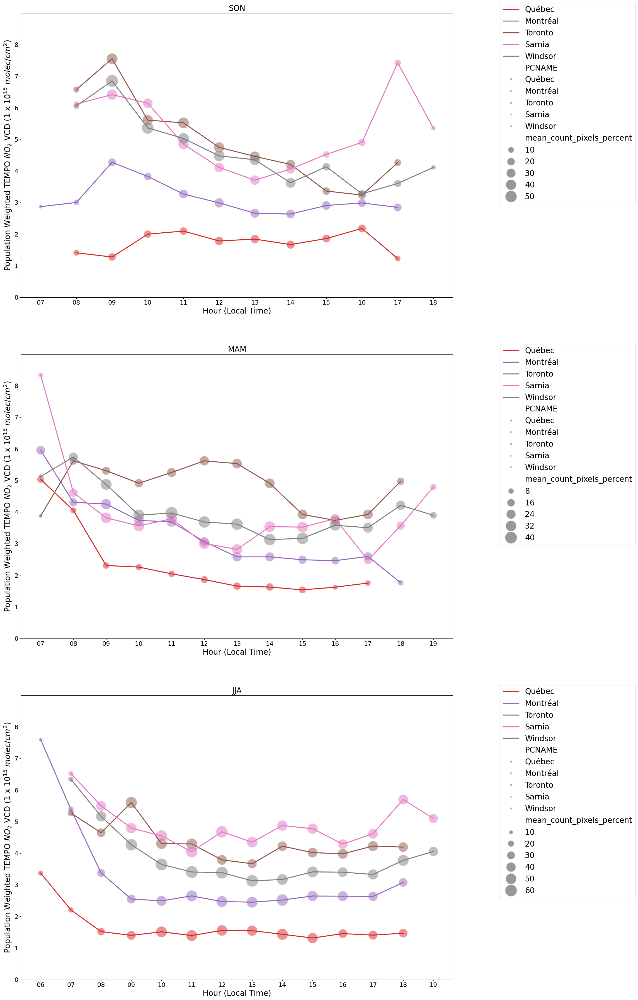

In [ ]:
fig, ax = plt.subplots(nrows=3, ncols=1, figsize=(20, 45))

seasons = ["SON","MAM","JJA"]

max_val = np.max([
    np.nanmax(seasonal_weighted_exposure[s][(seasonal_weighted_exposure[s]["days"] == "weekend") &
                                            (seasonal_weighted_exposure[s]["PCNAME"].isin(["Québec", "Montréal", "Toronto", "Sarnia", "Windsor"]))]["population_weighted_no2"])
    for s in seasons]
)

cmap = colors.ListedColormap(plt.cm.tab10.colors[3:])

c_count = 0

for s in seasons:

    plot_df = seasonal_weighted_exposure[s][(seasonal_weighted_exposure[s]["days"] == "weekend") &
                                            (seasonal_weighted_exposure[s]["PCNAME"].isin(["Québec", "Montréal", "Toronto", "Sarnia", "Windsor"]))]

    plot_df['PCNAME'] = plot_df['PCNAME'].astype("category").cat.set_categories(["Québec", "Montréal", "Toronto", "Sarnia", "Windsor"])
    plot_df['season'] = s

    plot_df = plot_df.merge(seasonal_count_pixel_exposure,
                            how = "left", left_on = ["PCNAME","season","days","hour"], right_on = ["city","season","wday","hour"])

    plot_df = plot_df.merge(qw_time.groupby(['season','city','wday','hour']).agg({'value': np.sum}).reset_index(),
                            how = "left", on = ['season',"city","wday","hour"])

    plot_df['mean_count_pixels_percent'] = plot_df['mean_count_pixels'] / plot_df['value'] * 100

    plot_df['hour'] = plot_df['hour'].astype("category").cat.set_categories(sorted(list(set(plot_df['hour']))))

    seaborn.lineplot(
        data = plot_df,
        x = "hour", y = "population_weighted_no2", hue="PCNAME",
        marker = "none", linewidth=2.5,
        palette = np.array(seaborn.color_palette())[3:],
        ax = ax[c_count]
    )
    seaborn.scatterplot(
        data = plot_df,
        x = "hour", y = "population_weighted_no2", hue="PCNAME", size = "mean_count_pixels_percent", sizes=(100, 1000), alpha=0.5,
        # legend = False,
        palette = np.array(seaborn.color_palette())[3:],
        ax = ax[c_count]
    )

    ax[c_count].set_ylim(0, round(max_val, 0)+1)
    ax[c_count].set_ylabel("Population Weighted TEMPO " + "$NO_{2}$" + " VCD (1 x " + "$10^{15}$ " + "$  molec/cm^{2})$", size=20)
    ax[c_count].set_xlabel("Hour (Local Time)", size=20)
    ax[c_count].set_title(s, size=20)
    ax[c_count].tick_params(axis='both', which='major', labelsize=16)
    ax[c_count].legend(title="", prop={'size': 20}, bbox_to_anchor=(1.1, 1.05))
    ax[c_count].set_yticks(np.arange(0, round(max_val, 0)+1, 1))

    c_count += 1

#### **3) Diurnal Hourly NO<sub>2</sub> Differences stratified by Seasons and Weekday-Weekend groups:**

In [ ]:
def make_wkday_hour_delta(city, no2_dayhour_agg, coords_arr, census_unit_data, population_data):

    coords_gdf = gpd.GeoDataFrame({
        "longitude": coords_arr[:,:,0].flatten(),
        "latitude": coords_arr[:,:,1].flatten(),
    })

    ##  extract area-weighted mean TEMPO tropospheric NO2 VCD Difference stratified by weekday-weekend split and hourly intervals

    for k in zip(sorted(no2_dayhour_agg.keys())[0:-1],
                 sorted(no2_dayhour_agg.keys())[1:]):

        for w in ["weekday", "weekend"]:

            if len(no2_dayhour_agg[k[0]][w].shape) > 0:
                no2_dayhour_agg[k[0]][w] = fetch_plot_Xr(no2_dayhour_agg[k[0]][w], coords_gdf)
            else:
                no2_dayhour_agg[k[0]][w] = np.empty((coords_arr.shape[0], coords_arr.shape[1]))
                no2_dayhour_agg[k[0]][w][:] = np.nan
                no2_dayhour_agg[k[0]][w] = fetch_plot_Xr(no2_dayhour_agg[k[0]][w], coords_gdf)

            if len(no2_dayhour_agg[k[1]][w].shape) > 0:
                no2_dayhour_agg[k[1]][w] = fetch_plot_Xr(no2_dayhour_agg[k[1]][w], coords_gdf)
            else:
                no2_dayhour_agg[k[1]][w] = np.empty((coords_arr.shape[0], coords_arr.shape[1]))
                no2_dayhour_agg[k[1]][w][:] = np.nan
                no2_dayhour_agg[k[1]][w] = fetch_plot_Xr(no2_dayhour_agg[k[1]][w], coords_gdf)

            city_interp_a = city_subset(city, no2_dayhour_agg[k[0]][w])
            city_interp_b = city_subset(city, no2_dayhour_agg[k[1]][w])

            #  i)  magnitude difference
            
            city_interp = city_interp_b - city_interp_a
            city_zs = eet.exact_extract(city_interp, census_unit_data[city], 'mean')
            city_zs = [city_zs[n]['properties']['mean'] for n in range(census_unit_data[city].shape[0])]
            census_unit_data[city]["tempo_no2_1st_diff_" + "hour_" + k[0] + "-" + k[1] + "_" + w] = pd.Series(city_zs)

            #  ii)  percentage difference

            city_interp = (city_interp_b - city_interp_a) / city_interp_a * 100
            city_zs = eet.exact_extract(city_interp, census_unit_data[city], 'mean')
            city_zs = [city_zs[n]['properties']['mean'] for n in range(census_unit_data[city].shape[0])]
            census_unit_data[city]["tempo_no2_1st_diff_perc_" + "hour_" + k[0] + "-" + k[1] + "_" + w] = pd.Series(city_zs)

    ##  merge with census unit population in 2021

    census_unit_data[city] = census_unit_data[city].merge(population_data[["DGUID","Population"]], on="DGUID", how="left")

    out = pd.melt(census_unit_data[city], id_vars=["DGUID","geometry","PCNAME","included","Population"])
    out["hour"] = out["variable"].apply(lambda x: x.replace("tempo_no2_1st_diff_","").replace("hour_","").replace("perc_","").split("_")[0])
    out["days"] = out["variable"].apply(lambda x: x.replace("tempo_no2_1st_diff_","").replace("hour_","").replace("perc_","").split("_")[1])
    out["value_format"] = out["variable"].apply(lambda x: "percentage" if "perc" in x else "magnitude")
    out = out[(out["Population"] > 0) & (~pd.isnull(out['value']))].reset_index(drop=True)

    ##  compute census population weighted NO2 hour-by-hour differences

    weighted = out.groupby(['PCNAME','hour','days',"value_format"]).agg(
        no2_delta = ("value", lambda x: np.average(x, weights = tem.loc[x.index, "Population"]))
    ).reset_index()

    weighted = pd.pivot_table(weighted, index=['PCNAME','hour','days'], columns=["value_format"], values=["no2_delta"]).reset_index()
    weighted.columns = ['PCNAME','hour','days','no2_delta_magnitude','no2_delta_percentage']

    return weighted

In [ ]:
delta_exposure = []

for city in  ["Halifax", "Saint John", "Cape Breton - Sydney", "Québec", "Montréal", "Toronto", "Sarnia", "Windsor"]:

    if city in ["Halifax", "Saint John"]:
        weighted = make_wkday_hour_delta(
            city, no2_dayhour_atl, coord_atl, within_cts, pop_cts
        )
    elif city in ["Québec", "Montréal", "Toronto", "Sarnia", "Windsor"]:
        weighted = make_wkday_hour_delta(
            city, no2_dayhour_qw, coord_qw, within_cts, pop_cts
        )
    else:
        weighted = make_wkday_hour_delta(
            city, no2_dayhour_atl, coord_atl, within_das, pop_das
        )

    delta_exposure.append(weighted)

delta_exposure = pd.concat(delta_exposure)
delta_exposure['no2_delta_magnitude'] = delta_exposure['no2_delta_magnitude'] / 1e15

delta_exposure['PCNAME'] = delta_exposure['PCNAME'].astype("category").cat.set_categories(
    ["Halifax", "Saint John", "Cape Breton - Sydney", "Québec", "Montréal", "Toronto", "Sarnia", "Windsor"]
)

In [ ]:
seasons = ["SON","DJF","MAM","JJA"]
seasonal_delta = {}

for s in seasons:

    s_weighted_delta = []

    for city in  ["Halifax", "Saint John", "Cape Breton - Sydney", "Québec", "Montréal", "Toronto", "Sarnia", "Windsor"]:

        if city in ["Halifax", "Saint John"]:
            weighted = make_wkday_hour_delta(
                city, no2_seasonal_dayhour_atl, coord_atl, within_cts, pop_cts
            )
        elif city in ["Québec", "Montréal", "Toronto", "Sarnia", "Windsor"]:
            weighted = make_wkday_hour_delta(
                city, no2_seasonal_dayhour_qw, coord_qw, within_cts, pop_cts
            )
        else:
            weighted = make_wkday_hour_delta(
                city, no2_seasonal_dayhour_atl, coord_atl, within_das, pop_das
            )

        s_weighted_delta.append(weighted)

    weighted_delta = pd.concat(s_weighted_delta)
    weighted_delta['no2_delta_magnitude'] = weighted_delta['no2_delta_magnitude'] / 1e15
    weighted_delta['PCNAME'] = weighted_delta['PCNAME'].astype("category").cat.set_categories(
        ["Halifax", "Saint John", "Cape Breton - Sydney", "Québec", "Montréal", "Toronto", "Sarnia", "Windsor"]
    )

    seasonal_delta[s] = weighted_delta

<Axes: xlabel='hour', ylabel='PCNAME'>

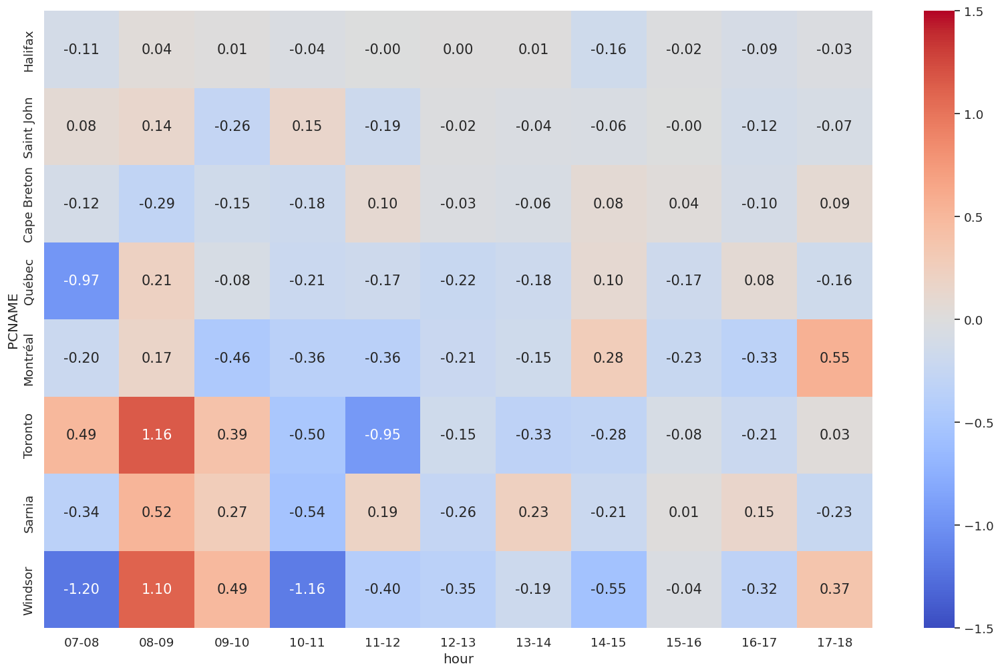

In [ ]:
plt.rcParams["figure.figsize"] = [20,12]
seaborn.set(font_scale=1.2)

plot_df = delta_exposure[
    (delta_exposure["days"] == "weekday") &
    (delta_exposure["hour"] != "06-07") &
    (delta_exposure["hour"] != "18-19")
]

plot_df['PCNAME'] = plot_df['PCNAME'].apply(lambda x: x.replace(" - Sydney", "") if x == "Cape Breton - Sydney" else x)

seaborn.heatmap(plot_df.pivot(index="PCNAME", columns="hour", values="no2_delta_magnitude"),
                annot=True, annot_kws={"size": 15}, xticklabels=True, yticklabels=True,
                fmt=".2f", cmap="coolwarm", vmin=-1.5, vmax=1.5)

<Axes: xlabel='hour', ylabel='PCNAME'>

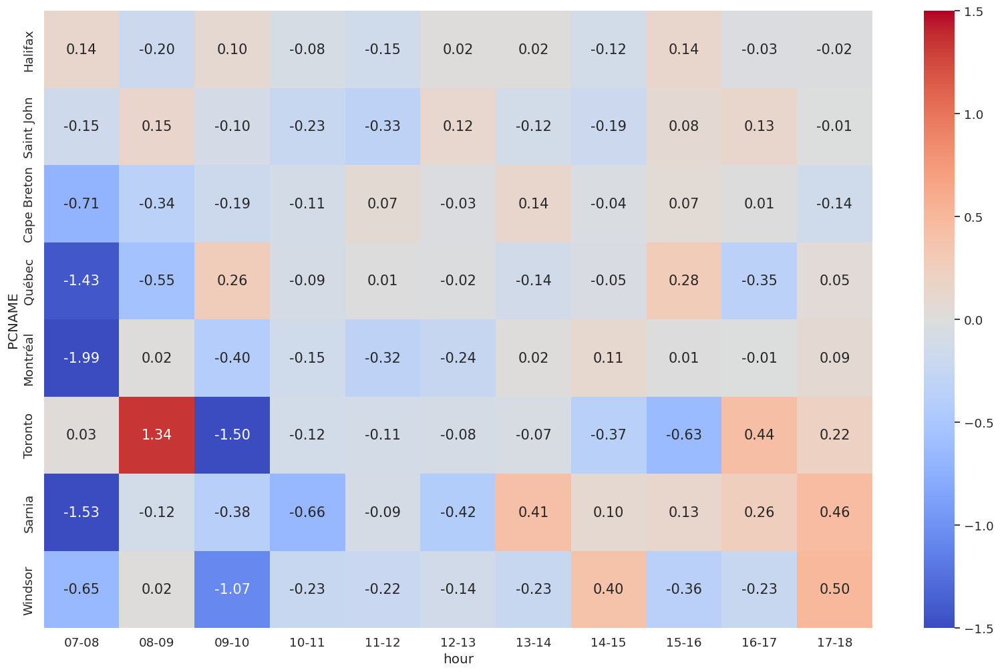

In [ ]:
plt.rcParams["figure.figsize"] = [20,12]
seaborn.set(font_scale=1.2)

plot_df = delta_exposure[
    (delta_exposure["days"] == "weekend") &
    (delta_exposure["hour"] != "06-07") &
    (delta_exposure["hour"] != "18-19")
]

plot_df['PCNAME'] = plot_df['PCNAME'].apply(lambda x: x.replace(" - Sydney", "") if x == "Cape Breton - Sydney" else x)

seaborn.heatmap(plot_df.pivot(index="PCNAME", columns="hour", values="no2_delta_magnitude"),
                annot=True, annot_kws={"size": 15}, xticklabels=True, yticklabels=True,
                fmt=".2f", cmap="coolwarm", vmin=-1.5, vmax=1.5)

<Axes: xlabel='hour', ylabel='PCNAME'>

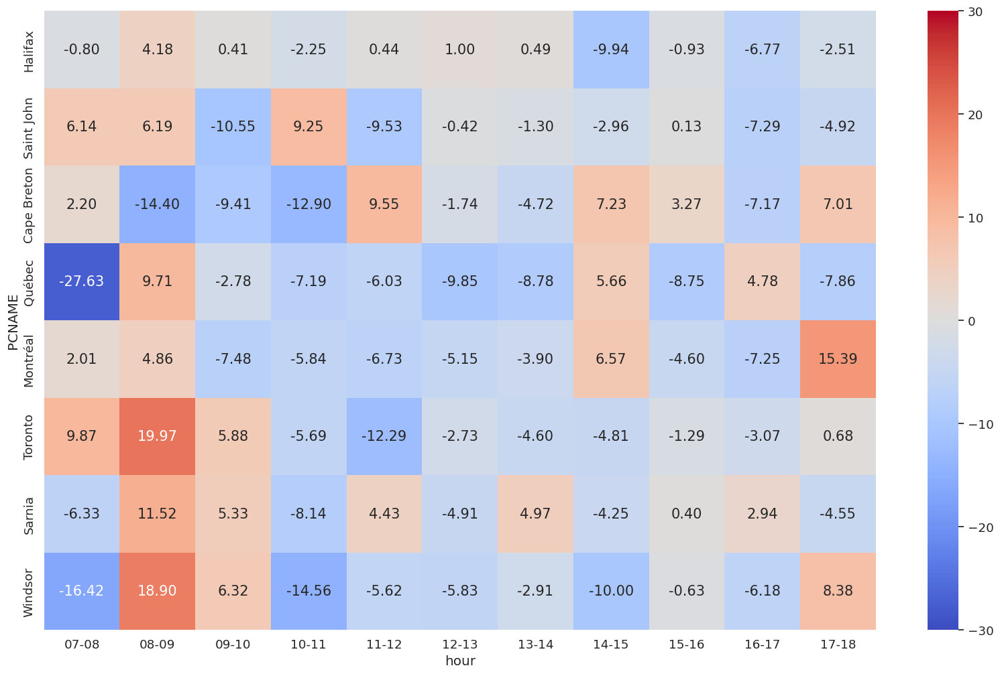

In [ ]:
plt.rcParams["figure.figsize"] = [20,12]
seaborn.set(font_scale=1.2)

plot_df = delta_exposure[
    (delta_exposure["days"] == "weekday") &
    (delta_exposure["hour"] != "06-07") &
    (delta_exposure["hour"] != "18-19")
]

plot_df['PCNAME'] = plot_df['PCNAME'].apply(lambda x: x.replace(" - Sydney", "") if x == "Cape Breton - Sydney" else x)

seaborn.heatmap(plot_df.pivot(index="PCNAME", columns="hour", values="no2_delta_percentage"),
                annot=True, annot_kws={"size": 15}, xticklabels=True, yticklabels=True,
                fmt=".2f", cmap="coolwarm", vmin=-30, vmax=30)

<Axes: xlabel='hour', ylabel='PCNAME'>

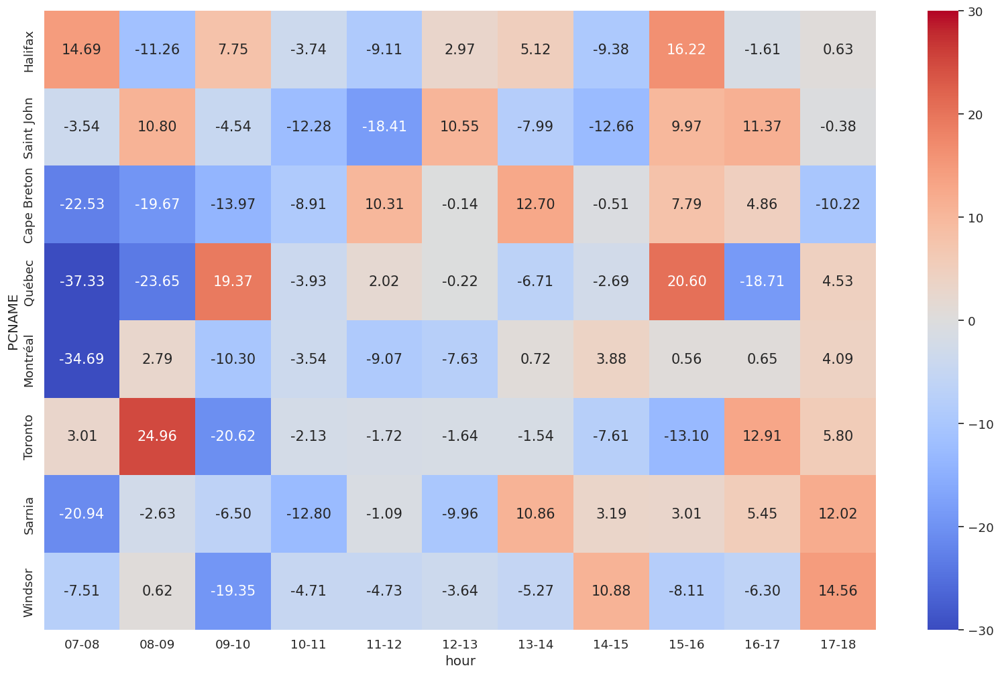

In [ ]:
plt.rcParams["figure.figsize"] = [20,12]
seaborn.set(font_scale=1.2)

plot_df = delta_exposure[
    (delta_exposure["days"] == "weekend") &
    (delta_exposure["hour"] != "06-07") &
    (delta_exposure["hour"] != "18-19")
]

plot_df['PCNAME'] = plot_df['PCNAME'].apply(lambda x: x.replace(" - Sydney", "") if x == "Cape Breton - Sydney" else x)

seaborn.heatmap(plot_df.pivot(index="PCNAME", columns="hour", values="no2_delta_percentage"),
                annot=True, annot_kws={"size": 15}, xticklabels=True, yticklabels=True,
                fmt=".2f", cmap="coolwarm", vmin=-30, vmax=30)

<Axes: xlabel='hour', ylabel='PCNAME-season'>

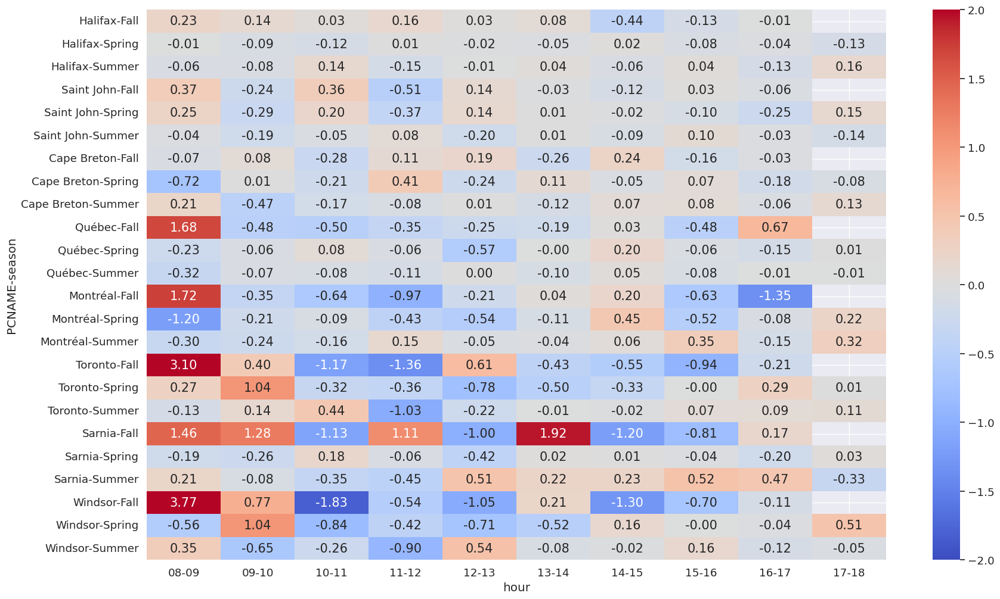

In [ ]:
plt.rcParams["figure.figsize"] = [20,12]
seaborn.set(font_scale=1.2)

df1 = seasonal_delta['SON'][
    (seasonal_delta['SON']["days"] == "weekday") &
    (seasonal_delta['SON']["hour"] != "06-07") &
    (seasonal_delta['SON']["hour"] != "07-08") &
    (seasonal_delta['SON']["hour"] != "17-18") &
    (seasonal_delta['SON']["hour"] != "18-19")
]
df2 = seasonal_delta['MAM'][
    (seasonal_delta['MAM']["days"] == "weekday") &
    (seasonal_delta['MAM']["hour"] != "06-07") &
    (seasonal_delta['MAM']["hour"] != "07-08") &
    (seasonal_delta['MAM']["hour"] != "18-19")
]
df3 = seasonal_delta['JJA'][
    (seasonal_delta['JJA']["days"] == "weekday") &
    (seasonal_delta['JJA']["hour"] != "06-07") &
    (seasonal_delta['JJA']["hour"] != "07-08") &
    (seasonal_delta['JJA']["hour"] != "18-19")
]

df1['season'] = "Fall"
df2['season'] = "Spring"
df3['season'] = "Summer"

plot_df = pd.concat([df1, df2, df3])

plot_df['PCNAME'] = plot_df['PCNAME'].apply(lambda x: x.replace(" - Sydney", "") if x == "Cape Breton - Sydney" else x)


seaborn.heatmap(plot_df.pivot(index=["PCNAME", 'season'], columns="hour", values="no2_delta_magnitude"),
                annot=True, annot_kws={"size": 15}, xticklabels=True, yticklabels=True,
                fmt=".2f", cmap="coolwarm", vmin=-2.0, vmax=2.0)

<Axes: xlabel='hour', ylabel='PCNAME-season'>

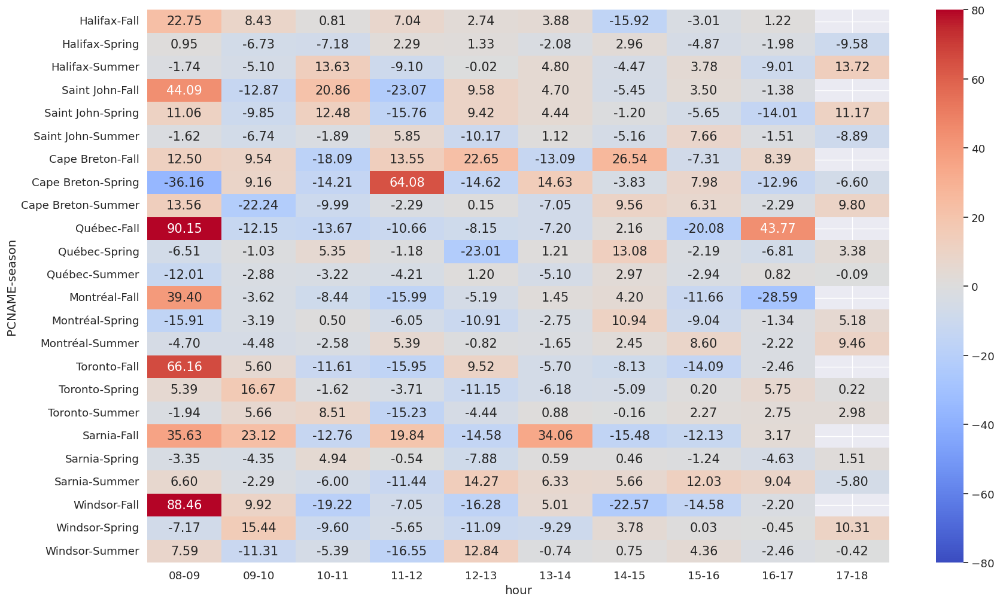

In [ ]:
plt.rcParams["figure.figsize"] = [20,12]
seaborn.set(font_scale=1.2)

df1 = seasonal_delta['SON'][
    (seasonal_delta['SON']["days"] == "weekday") &
    (seasonal_delta['SON']["hour"] != "06-07") &
    (seasonal_delta['SON']["hour"] != "07-08") &
    (seasonal_delta['SON']["hour"] != "17-18") &
    (seasonal_delta['SON']["hour"] != "18-19")
]
df2 = seasonal_delta['MAM'][
    (seasonal_delta['MAM']["days"] == "weekday") &
    (seasonal_delta['MAM']["hour"] != "06-07") &
    (seasonal_delta['MAM']["hour"] != "07-08") &
    (seasonal_delta['MAM']["hour"] != "18-19")
]
df3 = seasonal_delta['JJA'][
    (seasonal_delta['JJA']["days"] == "weekday") &
    (seasonal_delta['JJA']["hour"] != "06-07") &
    (seasonal_delta['JJA']["hour"] != "07-08") &
    (seasonal_delta['JJA']["hour"] != "18-19")
]

df1['season'] = "Fall"
df2['season'] = "Spring"
df3['season'] = "Summer"

plot_df = pd.concat([df1, df2, df3])

plot_df['PCNAME'] = plot_df['PCNAME'].apply(lambda x: x.replace(" - Sydney", "") if x == "Cape Breton - Sydney" else x)

seaborn.heatmap(plot_df.pivot(index=["PCNAME", 'season'], columns="hour", values="no2_delta_percentage"),
                annot=True, annot_kws={"size": 15}, xticklabels=True, yticklabels=True,
                fmt=".2f", cmap="coolwarm", vmin=-80, vmax=80)

<Axes: xlabel='hour', ylabel='PCNAME-season'>

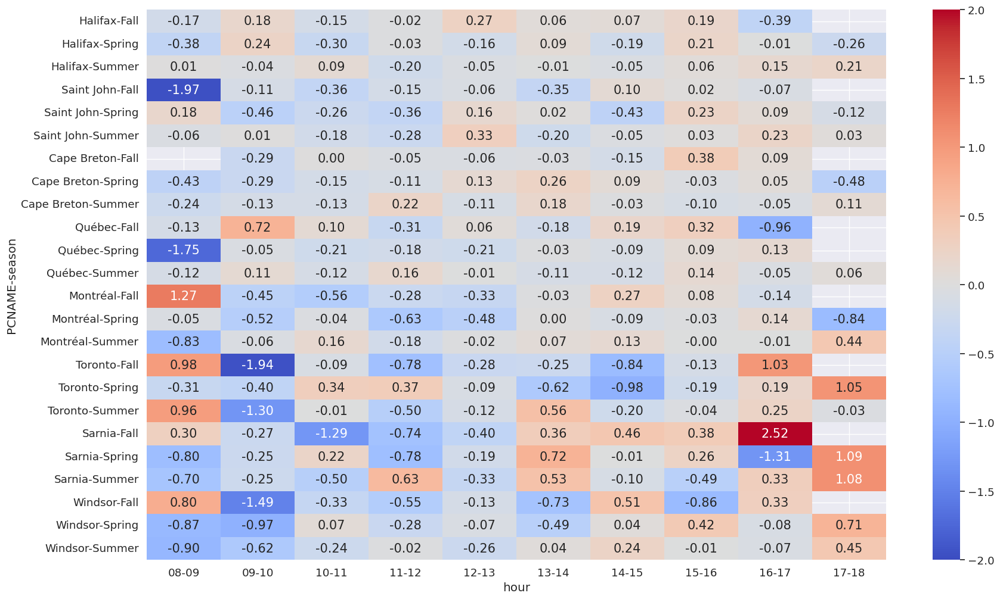

In [ ]:
plt.rcParams["figure.figsize"] = [20,12]
seaborn.set(font_scale=1.2)

df1 = seasonal_delta['SON'][
    (seasonal_delta['SON']["days"] == "weekend") &
    (seasonal_delta['SON']["hour"] != "06-07") &
    (seasonal_delta['SON']["hour"] != "07-08") &
    (seasonal_delta['SON']["hour"] != "17-18") &
    (seasonal_delta['SON']["hour"] != "18-19")
]
df2 = seasonal_delta['MAM'][
    (seasonal_delta['MAM']["days"] == "weekend") &
    (seasonal_delta['MAM']["hour"] != "06-07") &
    (seasonal_delta['MAM']["hour"] != "07-08") &
    (seasonal_delta['MAM']["hour"] != "18-19")
]
df3 = seasonal_delta['JJA'][
    (seasonal_delta['JJA']["days"] == "weekend") &
    (seasonal_delta['JJA']["hour"] != "06-07") &
    (seasonal_delta['JJA']["hour"] != "07-08") &
    (seasonal_delta['JJA']["hour"] != "18-19")
]

df1['season'] = "Fall"
df2['season'] = "Spring"
df3['season'] = "Summer"

plot_df = pd.concat([df1, df2, df3])

plot_df['PCNAME'] = plot_df['PCNAME'].apply(lambda x: x.replace(" - Sydney", "") if x == "Cape Breton - Sydney" else x)

seaborn.heatmap(plot_df.pivot(index=["PCNAME", 'season'], columns="hour", values="no2_delta_magnitude"),
                annot=True, annot_kws={"size": 15}, xticklabels=True, yticklabels=True,
                fmt=".2f", cmap="coolwarm", vmin=-2.0, vmax=2.0)

<Axes: xlabel='hour', ylabel='PCNAME-season'>

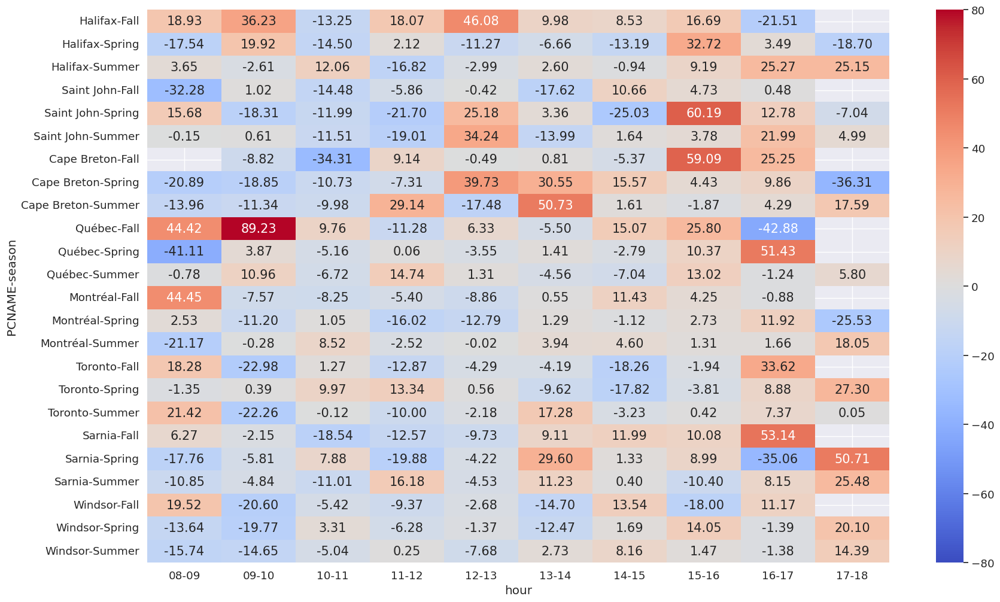

In [ ]:
plt.rcParams["figure.figsize"] = [20,12]
seaborn.set(font_scale=1.2)

df1 = seasonal_delta['SON'][
    (seasonal_delta['SON']["days"] == "weekend") &
    (seasonal_delta['SON']["hour"] != "06-07") &
    (seasonal_delta['SON']["hour"] != "07-08") &
    (seasonal_delta['SON']["hour"] != "17-18") &
    (seasonal_delta['SON']["hour"] != "18-19")
]
df2 = seasonal_delta['MAM'][
    (seasonal_delta['MAM']["days"] == "weekend") &
    (seasonal_delta['MAM']["hour"] != "06-07") &
    (seasonal_delta['MAM']["hour"] != "07-08") &
    (seasonal_delta['MAM']["hour"] != "18-19")
]
df3 = seasonal_delta['JJA'][
    (seasonal_delta['JJA']["days"] == "weekend") &
    (seasonal_delta['JJA']["hour"] != "06-07") &
    (seasonal_delta['JJA']["hour"] != "07-08") &
    (seasonal_delta['JJA']["hour"] != "18-19")
]

df1['season'] = "Fall"
df2['season'] = "Spring"
df3['season'] = "Summer"

plot_df = pd.concat([df1, df2, df3])

plot_df['PCNAME'] = plot_df['PCNAME'].apply(lambda x: x.replace(" - Sydney", "") if x == "Cape Breton - Sydney" else x)

seaborn.heatmap(plot_df.pivot(index=["PCNAME", 'season'], columns="hour", values="no2_delta_percentage"),
                annot=True, annot_kws={"size": 15}, xticklabels=True, yticklabels=True,
                fmt=".2f", cmap="coolwarm", vmin=-80, vmax=80)